In [2]:
exp = "exp050_opt2.7b"
device_id = 1

In [1]:
import glob
import sys
from typing import Optional
from transformers import (
    AutoTokenizer,
    PreTrainedTokenizer
)
import torch
from torch.utils.data import Dataset
from torch_geometric.data import Batch, HeteroData
from torch_geometric.utils import to_networkx
import networkx as nx
import polars as pl
import yaml
import json
import numpy as np
import matplotlib.pyplot as plt

/home/toda/LangEquippedNIDS/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
sys.path.append('..')
from train import load_model #, apply_lora_model

[2024-01-12 17:02:47,595] [INFO] [real_accelerator.py:161:get_accelerator] Setting ds_accelerator to cuda (auto detect)


# Functions

In [5]:
def generate_text(model, data, tokenizer: PreTrainedTokenizer):
    eos_token_id_list = [
        tokenizer.pad_token_id,
        tokenizer.eos_token_id,
    ]
    with torch.no_grad():
        out = model.generate(**data, max_length=128, do_sample=True, temperature=0.3, eos_token_id=eos_token_id_list)
        return tokenizer.batch_decode(out)

label_mapping={
    "BENIGN": 0,
    "Bot": 1,
    "DDoS": 2,
    "DoS": 3,
    "FTP-Patator": 4,
    "PortScan": 5,
    "SSH-Patator": 6,
    "Web": 7,
}
label_mapping_rev = {v: k for k, v in label_mapping.items()}

class SupervisedDataset(Dataset):
    """Dataset for supervised learning"""

    def __init__(
        self,
        model_name: str,
        dataset_dirname: str,
        dataframe_filename: str,
        instruction: str = "Explain ongoing activities and unique characteristics in this network.",
        max_length: int = 128,
    ):
        super(SupervisedDataset, self).__init__()
        self.instruction = instruction
        self.json_datafiles = sorted(glob.glob(f"{dataset_dirname}/*.json"))
        self.df = pl.read_parquet(f"{dataset_dirname}/{dataframe_filename}")
        self.feature_stats = {
            "Protocol": [8.148607616374722, 4.365238647498611],
            "Flow Duration": [21505373.62084664, 38620071.0667367],
            "Total Fwd Packets": [6.678572292654602, 499.83754801864484],
            "Total Backward Packets": [6.836452385560825, 676.1951958944544],
            "Total Length of Fwd Packets": [397.20103269460304, 13613.92287646111],
            "Total Length of Bwd Packets": [10330.4519178038, 1487551.518855612],
            "Fwd Packet Length Max": [170.59802937191523, 603.3754579426771],
            "Fwd Packet Length Min": [11.535409408368011, 56.88208169395191],
            "Fwd Packet Length Mean": [45.100791518750604, 160.09544237517886],
            "Fwd Packet Length Std": [60.74123915720519, 237.64434260418184],
            "Bwd Packet Length Max": [1749.5979759427723, 2898.8772313600102],
            "Bwd Packet Length Min": [23.49850902448466, 55.81978567295867],
            "Bwd Packet Length Mean": [574.9163508949277, 886.3962067857422],
            "Bwd Packet Length Std": [727.767657043599, 1278.5064429053614],
            "Flow Bytes/s": [982709.5046042904, 22265201.41050033],
            "Flow Packets/s": [81850.18785589066, 280111.61600749195],
            "Flow IAT Mean": [1997698.0951529408, 4954170.567419055],
            "Flow IAT Std": [5407605.053068946, 10529055.59541358],
            "Flow IAT Max": [17923485.24586176, 34655306.120365895],
            "Flow IAT Min": [171095.66285505178, 3227475.5929842866],
            "Fwd IAT Total": [21233227.55427191, 38611283.30551164],
            "Fwd IAT Mean": [3891338.7099747504, 9661907.262130573],
            "Fwd IAT Std": [7035202.164282467, 14278503.139225585],
            "Fwd IAT Max": [17807330.505612075, 34727903.69941009],
            "Fwd IAT Min": [753181.9202423869, 7588949.117041795],
            "Bwd IAT Total": [9531584.795173837, 28113440.661738154],
            "Bwd IAT Mean": [1838554.7839053825, 8141051.096174603],
            "Bwd IAT Std": [2425499.311169748, 8924451.4878789],
            "Bwd IAT Max": [6466752.524780033, 22044302.39679556],
            "Bwd IAT Min": [661517.6942824769, 6894341.695763947],
            "Fwd PSH Flags": [0.02958361560050324, 0.16943569349287801],
            "Fwd URG Flags": [7.560727765411787e-05, 0.008694920207078967],
            "Fwd Header Length": [-17146.512531654247, 11710937.15323628],
            "Bwd Header Length": [-911.5224987096358, 1078164.7709341298],
            "Fwd Packets/s": [73751.47934907237, 273997.1086047458],
            "Bwd Packets/s": [8153.649795293947, 38787.76780910029],
            "Min Packet Length": [9.52273158005097, 21.2183885055424],
            "Max Packet Length": [1802.9999939514178, 2923.013008927524],
            "Packet Length Mean": [289.1598595121686, 426.31518575295445],
            "Packet Length Std": [569.6797850621195, 924.1762715672427],
            "Packet Length Variance": [1178561.8197001894, 2535157.714716144],
            "FIN Flag Count": [0.06679650956482468, 0.24966937880786813],
            "SYN Flag Count": [0.02958361560050324, 0.16943569349287801],
            "RST Flag Count": [0.00015423884641440046, 0.012418341767585377],
            "PSH Flag Count": [0.3736128584793058, 0.4837628823914413],
            "ACK Flag Count": [0.36590998903190425, 0.4816846508425962],
            "URG Flag Count": [0.05527698474144327, 0.22852022305185404],
            "CWE Flag Count": [7.560727765411787e-05, 0.008694920207078967],
            "ECE Flag Count": [0.0001552469434497887, 0.012458852207012596],
            "Down/Up Ratio": [0.6605515500500017, 0.6649709179795937],
            "Average Packet Size": [319.05480559743114, 468.2256377037668],
            "Avg Fwd Segment Size": [45.100791518750604, 160.09544237517886],
            "Avg Bwd Segment Size": [574.9163508949348, 886.3962067857494],
            "Subflow Fwd Packets": [6.678572292654602, 499.83754801864484],
            "Subflow Fwd Bytes": [397.1711305203394, 13585.59273367086],
            "Subflow Bwd Packets": [6.836452385560825, 676.1951958944544],
            "Subflow Bwd Bytes": [10329.445839986774, 1487209.441882914],
            "Init_Win_bytes_forward": [6884.511062856866, 12621.774069534258],
            "Init_Win_bytes_backward": [1138.028486806026, 6317.615566522921],
            "act_data_pkt_fwd": [3.5639062953643665, 443.755590874133],
            "min_seg_size_forward": [-1597.0139198038646, 933643.4415869396],
            "Active Mean": [91678.23376173584, 674841.6478783253],
            "Active Std": [31508.059288757584, 365853.06166950404],
            "Active Max": [137976.10776254878, 935204.571372991],
            "Active Min": [72609.30250774219, 620893.9016245442],
            "Idle Mean": [16819298.773389965, 33852847.04602872],
            "Idle Std": [962361.9206674964, 6654896.943241148],
            "Idle Max": [17551255.71322462, 34735242.44776471],
            "Idle Min": [16111871.063147198, 33652557.28816393],
        }
        self.max_length = max_length
        self.tokenizer = AutoTokenizer.from_pretrained(model_name, padding_side="right")

    def __len__(self) -> int:
        return len(self.json_datafiles)

    def __getitem__(self, index) -> tuple[dict, HeteroData, str, str, list[int]]:
        # load text
        json_filename = self.json_datafiles[index]
        with open(json_filename) as jf:
            json_dict = json.load(jf)

        # IMPORTANT: Experiment with changing prompt
        question = ""
        answer = json_dict["response"]
        ground_text = f"##Instruction: {self.instruction} ##Question: {question} ##Answer: {answer}"
        text_prompt = f"##Instruction: {self.instruction} ##Question: {question} ##Answer:"

        # load graph
        indices = list(map(int, json_dict["referenced_flow_indices"]))
        graph, _ = self.construct_hetero_data(
            df=self.df[indices],
            onehot_columns=[
                "is_dest_port_21",
                "is_dest_port_22",
                "is_dest_port_80",
                "is_dest_port_443",
                "is_dest_port_444",
                "is_dest_port_445",
                "is_dest_port_139",
                "is_dest_port_8080",
            ],
            unused_features=[
                "Flow ID",  # ex) 192.168.10.5-104.16.207.165-54865-443-6
                "Source IP",
                "Destination IP",
                "Source Port",
                "Destination Port",  # Destination port is already converted to one-hot feature
                "Timestamp",  # ex) 2017-07-07 03:30:00
                "Fwd Header Length_duplicated_0",  # duplicated column
                "Bwd PSH Flags",
                "Bwd URG Flags",
                "Fwd Avg Bytes/Bulk",
                "Fwd Avg Packets/Bulk",
                "Fwd Avg Bulk Rate",
                "Bwd Avg Bytes/Bulk",
                "Bwd Avg Packets/Bulk",
                "Bwd Avg Bulk Rate",
            ],
            label_mapping=label_mapping,
            statistics=self.feature_stats,
        )

        # generate a whole dataset by combining text and graph
        inputs = self.tokenizer(
            text_prompt,
            return_tensors="pt",
            # max_length=self.max_length,
            # padding="max_length",
            truncation=True,
        )
        # batch size 1 -> unbatch
        inputs = {k: v.to(f"cuda:{device_id}") for k, v in inputs.items()}  # IMPORTANT: remain batching as is
        inputs["labels"] = None # inputs["input_ids"]
        inputs["graph_data"] = Batch.from_data_list([graph]).to(f"cuda:{device_id}")
        return inputs, graph, text_prompt, ground_text, indices

    def construct_hetero_data(
        self,
        df: pl.DataFrame,  # this dataframe should contain only features+label
        onehot_columns: list[str],
        unused_features: list[str],
        label_mapping: dict[str, int],
        statistics: Optional[dict[str, tuple[float, float]]] = None,
    ) -> tuple[HeteroData, dict[str, int]]:
        ### extract label info
        labels = []
        for label in df["NewLabel"]:
            labels.append(
                [
                    1 if label_mapping[label] == i else 0
                    for i in range(len(label_mapping))
                ]
            )
        labels = np.array(labels, dtype=np.float32)

        ### extract features
        df_features = df.drop("NewLabel", *unused_features)
        for col in df_features.columns:
            if col in onehot_columns:
                continue
            if statistics:
                mean, stddev = statistics[col]
                df_features = df_features.with_columns(
                    (pl.col(col) - mean) / (stddev + 1e-5)
                )
        features = df_features.to_numpy()

        # mapping (ipaddr to host)
        all_ip_addrs = pl.concat(items=[df["Source IP"], df["Destination IP"]])
        ip2hostid = {ip: i for i, ip in enumerate(all_ip_addrs.unique())}

        ### extract edge_index
        appeared_hosts = set()
        pointing_host2flow = []
        pointed_host2flow = []
        pointing_flow2host = []
        pointed_flow2host = []
        pointing_flow2flow = []
        pointed_flow2flow = []
        last_srcip = ""
        last_destip = ""
        last_flow_idx = ""
        last_timestamp = None
        # IMPORTANT: Actually, "Flow ID" column is not unique. So we simply use index as Flow ID
        for flow_idx, (srcip, destip, timestamp) in enumerate(
            zip(df["Source IP"], df["Destination IP"], df["Timestamp"])
        ):
            # flow => subsequent flow
            if all([srcip == last_srcip, destip == last_destip]):
                assert (
                    timestamp >= last_timestamp
                ), "Flows are not sorted according to the timestamp."
                pointing_flow2flow.append(last_flow_idx)
                pointed_flow2flow.append(flow_idx)

            # src => flow
            pointing_host2flow.append(ip2hostid[srcip])
            pointed_host2flow.append(flow_idx)
            appeared_hosts.add(ip2hostid[srcip])
            # flow => dest
            pointing_flow2host.append(flow_idx)
            pointed_flow2host.append(ip2hostid[destip])
            appeared_hosts.add(ip2hostid[destip])

            # update
            last_flow_idx = flow_idx
            last_srcip = srcip
            last_destip = destip
            last_timestamp = timestamp

        host_sends = torch.stack(
            [
                torch.from_numpy(np.array(pointing_host2flow, dtype=int)),
                torch.from_numpy(np.array(pointed_host2flow, dtype=int)),
            ],
            dim=0,
        )
        flow_reaches = torch.stack(
            [
                torch.from_numpy(np.array(pointing_flow2host, dtype=int)),
                torch.from_numpy(np.array(pointed_flow2host, dtype=int)),
            ],
            dim=0,
        )
        flow_precedes = torch.stack(
            [
                torch.from_numpy(np.array(pointing_flow2flow, dtype=int)),
                torch.from_numpy(np.array(pointed_flow2flow, dtype=int)),
            ],
            dim=0,
        )

        ### construct HeteroData
        data = HeteroData()
        # node info
        data["host"].node_id = torch.from_numpy(np.array(list(appeared_hosts)))
        data["flow"].node_id = torch.arange(len(df))  # id for flow is simply an index
        data["flow"].x = torch.from_numpy(features).to(torch.float)
        data["flow"].y = torch.from_numpy(labels).to(torch.float)
        # edge info
        data["host", "sends", "flow"].edge_index = host_sends
        data["flow", "reaches", "host"].edge_index = flow_reaches
        data["flow", "precedes", "flow"].edge_index = flow_precedes

        # TODO: evaluate effectiveness of this operation
        # data = tgT.ToUndirected()(data)

        return data, ip2hostid


class MyDataCollator:
    def __init__(self):
        pass

    def __call__(self, examples: list[dict]):
        dict_keys = examples[0].keys()
        return {
            key: (
                Batch.from_data_list([example[key] for example in examples])
                if key == "graph_data"
                else torch.vstack([example[key] for example in examples])
            )
            for key in dict_keys
        }

# Load configs

In [6]:
config_file = f"../configs/training_config_{exp}.yml"

# get config
with open(config_file, "r") as i_:
    config = yaml.safe_load(i_)


# model
model_name = config["settings"]["model_name"]
keys_finetune = config["settings"]["keys_finetune"]

# Load a pretrained model

In [7]:
model_path = "/data/toda/GNN-OPT/output-opt-2.7b-multi-inst/exp050_opt2.7b/exp050_opt2.7b_final"
model = load_model(model_path, vision_model_name=None, num_image_with_embedding=None)

# # lora
# if config["use_lora"]:
#     keys_finetune.append("lora")
#     model = apply_lora_model(model, model_name, config)

# weight = {}
# weight_path = glob.glob(f'../output/{exp}/checkpoint*/pytorch*.bin')
# for w in weight_path:
#     weight_temp = torch.load(w, map_location="cpu")
#     weight.update(weight_temp)
# model.load_state_dict(weight, strict=False)

model.eval()
model = model.to(device=f"cuda:{device_id}")
print("Complete preparing an eval model. Model is on:", model.device)

GNN Model loading result: <All keys matched successfully>


Loading checkpoint shards: 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]


Complete preparing an eval model. Model is on: cuda:1


In [8]:
print(model)

GNNOPTForCausalLM(
  (model): GNNOPTModel(
    (decoder): OPTDecoder(
      (embed_tokens): Embedding(50272, 2560, padding_idx=1)
      (embed_positions): OPTLearnedPositionalEmbedding(2050, 2560)
      (final_layer_norm): LayerNorm((2560,), eps=1e-05, elementwise_affine=True)
      (layers): ModuleList(
        (0-31): 32 x OPTDecoderLayer(
          (self_attn): OPTAttention(
            (k_proj): Linear(in_features=2560, out_features=2560, bias=True)
            (v_proj): Linear(in_features=2560, out_features=2560, bias=True)
            (q_proj): Linear(in_features=2560, out_features=2560, bias=True)
            (out_proj): Linear(in_features=2560, out_features=2560, bias=True)
          )
          (activation_fn): ReLU()
          (self_attn_layer_norm): LayerNorm((2560,), eps=1e-05, elementwise_affine=True)
          (fc1): Linear(in_features=2560, out_features=10240, bias=True)
          (fc2): Linear(in_features=10240, out_features=2560, bias=True)
          (final_layer_norm)

In [13]:
supervised_test_dataset = SupervisedDataset(
    model_name=model_name,
    dataset_dirname="/tmp/test_flows",
    dataframe_filename="test_df.parquet",
)

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


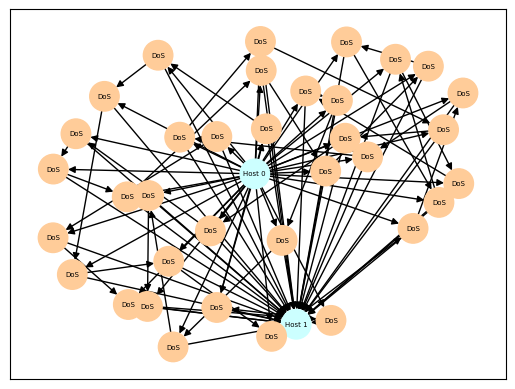

In [10]:
def visualize_graph(graph: HeteroData) -> None:
    nodetype2nodenum = {}
    flow_labels = []
    for node_tensor, node_type in zip(graph.node_stores, ["host", "flow"]):
        nodetype2nodenum[node_type] = len(node_tensor["node_id"].tolist())
        if node_type == "flow":
            flow_labels = torch.argmax(node_tensor["y"], dim=1).tolist()
            flow_labels = list(map(lambda labelidx: label_mapping_rev[labelidx], flow_labels))
    node_label_dict = {idx: f"Host {idx}" for idx in range(nodetype2nodenum["host"])}
    flow_label_dict = {nodetype2nodenum["host"]+idx: label for idx, label in enumerate(flow_labels)}
    nx_graph: nx.DiGraph = to_networkx(graph)
    pos = nx.spring_layout(nx_graph, k=0.8)
    nx.draw_networkx(
        G=nx_graph,
        pos=pos,
        node_size=450,
        node_color=["#ccffff" if idx < nodetype2nodenum["host"] else "#ffcc99" for idx in range(sum(nodetype2nodenum.values()))],
        # node_shape="s",
        labels={**node_label_dict, **flow_label_dict},
        font_size=5
    )
    plt.show()

_, graph, _, _, _ = supervised_test_dataset[121]
# GOOD EXPLANATION
# - 121,
# INTERESTING GRAPH
# - 152,
visualize_graph(graph=graph)

# Inference

In [11]:
def visualize_graph_and_show_explanation(idx: int) -> None:
    data, graph, text_prompt, ground_text, referenced_indices = supervised_test_dataset[idx]
    print("-" * 20)
    print("referenced indices:", referenced_indices)
    print("generated text:", generate_text(model, data, supervised_test_dataset.tokenizer))
    print("ground text:", ground_text)
    visualize_graph(graph=graph)

In [11]:
# visualize_graph_and_show_explanation(70)

--------------------
referenced indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network was observed to be a relatively stable and secure environment, characterized by a high degree of trust and low levels of security threats. The majority of the traffic was between two or three networks, with a small number of connections between individual hosts. The majority of the traffic was between two or three networks, with a small number of connections between individual hosts.\nThe majority of the traffic was between two or three networks, with a small number of connections between individual hosts. The majority of the traffic was between two or three networks,']
ground text: ##Instruction: Explain ongoing activities and unique characteristics in this network. ##Questi

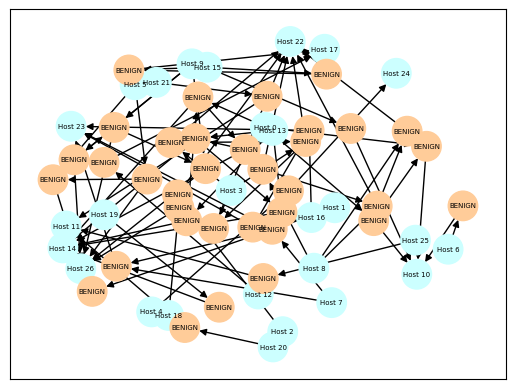

--------------------
referenced indices: [3500, 3501, 3502, 3503, 3504, 3505, 3506, 3507, 3508, 3509, 3510, 3511, 3512, 3513, 3514, 3515, 3516, 3517, 3518, 3519, 3520, 3521, 3522, 3523, 3524, 3525, 3526, 3527, 3528, 3529, 3530, 3531, 3532, 3533, 3534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network was characterized by a high volume of data traffic, with a high proportion of data packets being dropped, and a low proportion of data packets being successfully delivered. The network was also characterized by a high proportion of data packets being dropped, and a low proportion of data packets being successfully delivered.\nThe network was characterized by a high volume of data traffic, with a high proportion of data packets being dropped, and a low proportion of data packets being successfully delivered. The network was also characterized by a high proportion of data packets being']
ground text:

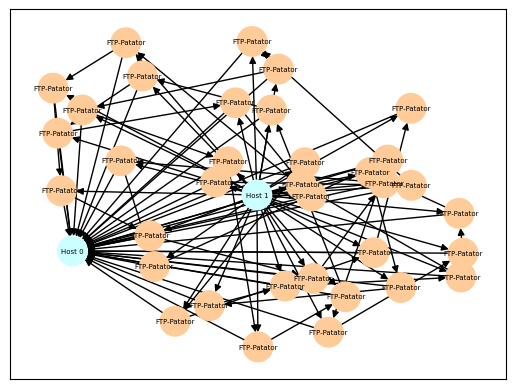

--------------------
referenced indices: [7000, 7001, 7002, 7003, 7004, 7005, 7006, 7007, 7008, 7009, 7010, 7011, 7012, 7013, 7014, 7015, 7016, 7017, 7018, 7019, 7020, 7021, 7022, 7023, 7024, 7025, 7026, 7027, 7028, 7029, 7030, 7031, 7032, 7033, 7034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of network congestion, with a high proportion of packets being dropped or delayed. The network also exhibited a high degree of packet loss, with a high proportion of packets being dropped or delayed. The network also exhibited a high proportion of packets being dropped or delayed. The network also exhibited a high proportion of packets being dropped or delayed.\nThe network also exhibited a high proportion of packets being dropped or delayed. The network also exhibited a high proportion of packets being dropped or delayed.\nThe network also exhibited a']
ground text: ##Instr

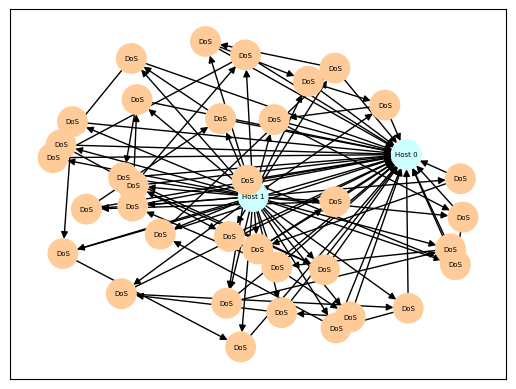

--------------------
referenced indices: [10500, 10501, 10502, 10503, 10504, 10505, 10506, 10507, 10508, 10509, 10510, 10511, 10512, 10513, 10514, 10515, 10516, 10517, 10518, 10519, 10520, 10521, 10522, 10523, 10524, 10525, 10526, 10527, 10528, 10529, 10530, 10531, 10532, 10533, 10534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network was characterized by a high volume of data transfers, with a large proportion of the data being sent from one source to another. The majority of the data transfers were initiated by a single source, with a small proportion of the data transfers originating from multiple sources. The data transfers were characterized by a high volume of data transfers, with a large proportion of the data transfers being sent from one source to another. The majority of the data transfers were initiated by a single source, with a small proportion of the data transfers originating fro

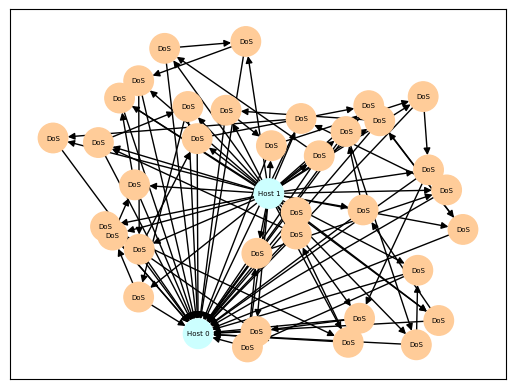

--------------------
referenced indices: [14000, 14001, 14002, 14003, 14004, 14005, 14006, 14007, 14008, 14009, 14010, 14011, 14012, 14013, 14014, 14015, 14016, 14017, 14018, 14019, 14020, 14021, 14022, 14023, 14024, 14025, 14026, 14027, 14028, 14029, 14030, 14031, 14032, 14033, 14034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network was characterized by a high volume of traffic originating from a single source, which was predominantly comprised of spam and phishing attacks. The network was also characterized by a high volume of traffic originating from a single source, which was predominantly comprised of spam and phishing attacks.\nThe network was also characterized by a high volume of traffic originating from a single source, which was predominantly comprised of spam and phishing attacks.\nThe network was also characterized by a high volume of traffic originating from a single source, whic

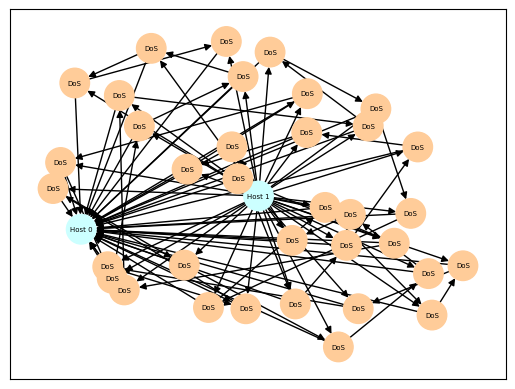

--------------------
referenced indices: [17500, 17501, 17502, 17503, 17504, 17505, 17506, 17507, 17508, 17509, 17510, 17511, 17512, 17513, 17514, 17515, 17516, 17517, 17518, 17519, 17520, 17521, 17522, 17523, 17524, 17525, 17526, 17527, 17528, 17529, 17530, 17531, 17532, 17533, 17534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of congestion, with a large proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or']
groun

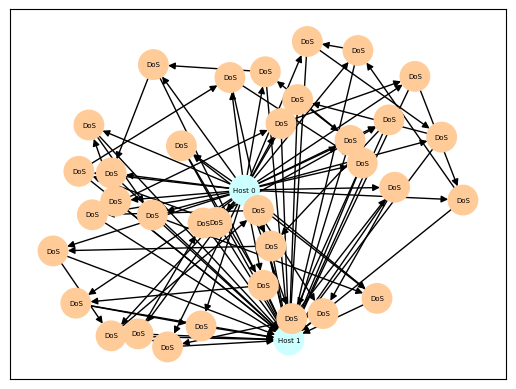

--------------------
referenced indices: [21000, 21001, 21002, 21003, 21004, 21005, 21006, 21007, 21008, 21009, 21010, 21011, 21012, 21013, 21014, 21015, 21016, 21017, 21018, 21019, 21020, 21021, 21022, 21023, 21024, 21025, 21026, 21027, 21028, 21029, 21030, 21031, 21032, 21033, 21034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of traffic flowing through a small number of ports. The network also exhibited a high degree of traffic fragmentation, with a high proportion of traffic flowing through a small number of ports. The network also exhibited a high degree of packet loss, with a high proportion of packets failing to arrive at their destination. The network also exhibited a high degree of packet delay, with a high proportion of packets arriving at their destination after a delay of more than one second. The network al

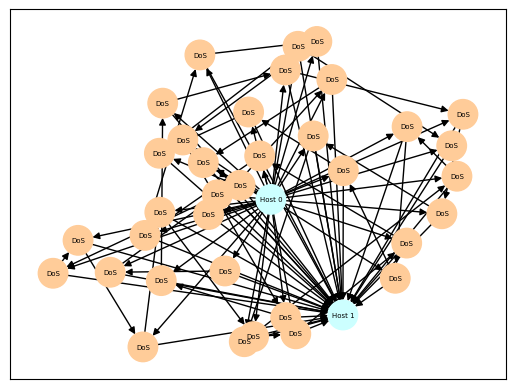

--------------------
referenced indices: [24500, 24501, 24502, 24503, 24504, 24505, 24506, 24507, 24508, 24509, 24510, 24511, 24512, 24513, 24514, 24515, 24516, 24517, 24518, 24519, 24520, 24521, 24522, 24523, 24524, 24525, 24526, 24527, 24528, 24529, 24530, 24531, 24532, 24533, 24534]
generated text: ["</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped or delayed. The network's average packet loss rate was approximately 50%, with a high proportion of dropped packets and delayed packets. The network's average packet delay was approximately 2.5 seconds, with a high proportion of dropped packets and delayed packets. The network's average packet arrival time was approximately 1.5 seconds, with a high proportion of dropped packets and delayed packets. The network's average packet throughput was approximately 1.5 Mbps, with"

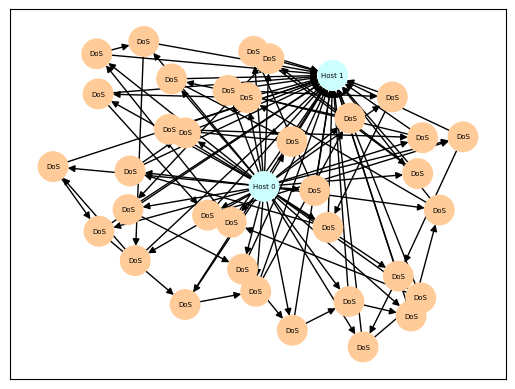

--------------------
referenced indices: [28000, 28001, 28002, 28003, 28004, 28005, 28006, 28007, 28008, 28009, 28010, 28011, 28012, 28013, 28014, 28015, 28016, 28017, 28018, 28019, 28020, 28021, 28022, 28023, 28024, 28025, 28026, 28027, 28028, 28029, 28030, 28031, 28032, 28033, 28034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, with a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped']


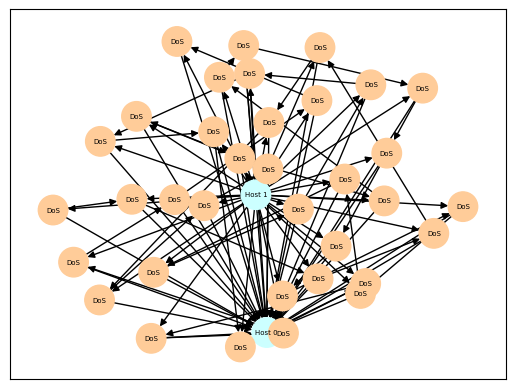

--------------------
referenced indices: [31500, 31501, 31502, 31503, 31504, 31505, 31506, 31507, 31508, 31509, 31510, 31511, 31512, 31513, 31514, 31515, 31516, 31517, 31518, 31519, 31520, 31521, 31522, 31523, 31524, 31525, 31526, 31527, 31528, 31529, 31530, 31531, 31532, 31533, 31534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high volume of data transfers, with a relatively high proportion of these transfers being initiated by the same source IP address. The source IP address was frequently associated with a large number of data transfers, with a relatively high proportion of these transfers being initiated by the same source IP address. This pattern of high volume of data transfers from a single source IP address is consistent with a high-volume data transfer service. The network also exhibited a high proportion of data transfers initiated by a single port, with a relative

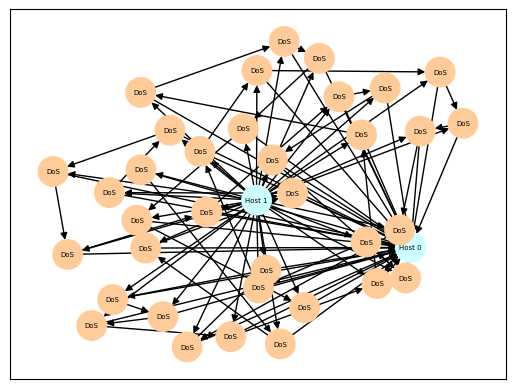

--------------------
referenced indices: [35000, 35001, 35002, 35003, 35004, 35005, 35006, 35007, 35008, 35009, 35010, 35011, 35012, 35013, 35014, 35015, 35016, 35017, 35018, 35019, 35020, 35021, 35022, 35023, 35024, 35025, 35026, 35027, 35028, 35029, 35030, 35031, 35032, 35033, 35034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a large proportion of the network traffic being of the type of data transfer that typically occurs in congested networks. The network also exhibited a high degree of packet loss, with a large proportion of the network traffic being of the type of data transfer that typically occurs in congested networks. The network also exhibited a high degree of packet loss, with a large proportion of the network traffic being of the type of data transfer that typically occurs in congested networks.\nThe network also exhibited'

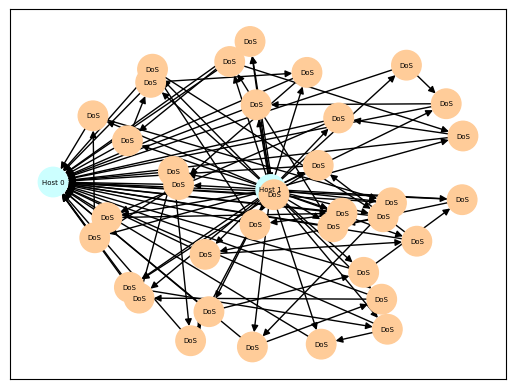

--------------------
referenced indices: [38500, 38501, 38502, 38503, 38504, 38505, 38506, 38507, 38508, 38509, 38510, 38511, 38512, 38513, 38514, 38515, 38516, 38517, 38518, 38519, 38520, 38521, 38522, 38523, 38524, 38525, 38526, 38527, 38528, 38529, 38530, 38531, 38532, 38533, 38534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network was observed to be a highly distributed, highly active, and highly diverse network. The network was characterized by a high degree of connectivity, with a large number of hosts interconnected to a small number of ports. The majority of hosts were running open-source software, and most of the hosts were running Linux. The network was predominantly used for file sharing and file transfer. The network was also characterized by a high degree of diversity, with a large number of hosts connected to a small number of ports. The majority of hosts were']
ground text: ##In

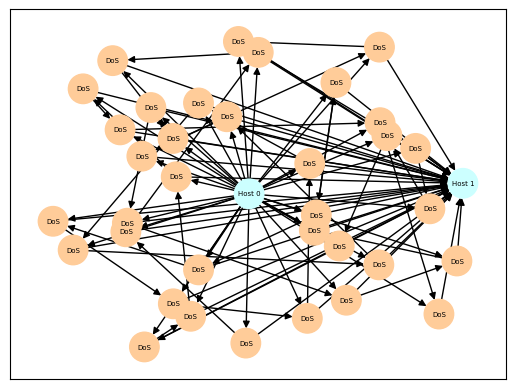

--------------------
referenced indices: [42000, 42001, 42002, 42003, 42004, 42005, 42006, 42007, 42008, 42009, 42010, 42011, 42012, 42013, 42014, 42015, 42016, 42017, 42018, 42019, 42020, 42021, 42022, 42023, 42024, 42025, 42026, 42027, 42028, 42029, 42030, 42031, 42032, 42033, 42034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network is characterized by a high volume of traffic from a single source, with a high degree of similarity between the source and destination IP addresses. This source is often a botnet, and the destination is often a legitimate user. The source IP address is often a botnet, and the destination is often a legitimate user. The source IP address is often a botnet, and the destination is often a legitimate user.\nThis network is characterized by a high volume of traffic from a single source, with a high degree of similarity']
ground text: ##Instruction: Explain ongoing act

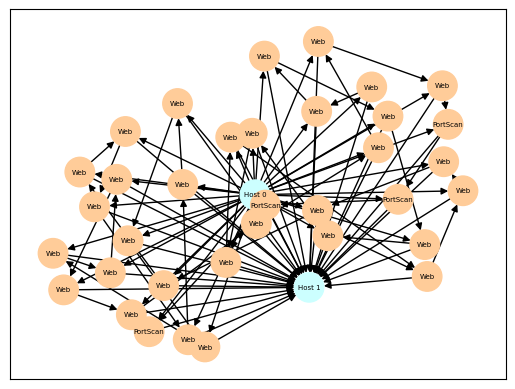

--------------------
referenced indices: [45500, 45501, 45502, 45503, 45504, 45505, 45506, 45507, 45508, 45509, 45510, 45511, 45512, 45513, 45514, 45515, 45516, 45517, 45518, 45519, 45520, 45521, 45522, 45523, 45524, 45525, 45526, 45527, 45528, 45529, 45530, 45531, 45532, 45533, 45534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high level of traffic congestion, with a large number of packets flowing through the network at a high rate. The network also exhibited a high level of packet loss, with a large number of packets being dropped or lost. The network also exhibited a high level of packet delay, with a large number of packets being delayed or dropped. The network also exhibited a high level of packet error, with a large number of packets being corrupted or lost. The network also exhibited a high level of packet delay, with a large number']
ground text: ##Instruction: Expla

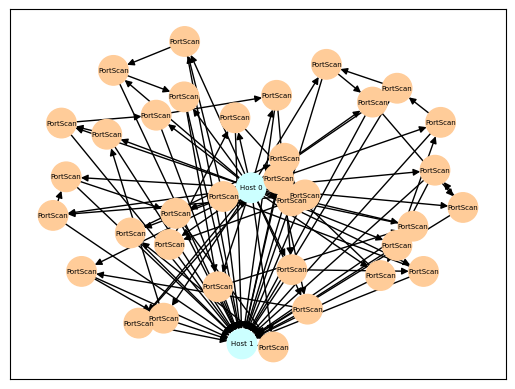

--------------------
referenced indices: [49000, 49001, 49002, 49003, 49004, 49005, 49006, 49007, 49008, 49009, 49010, 49011, 49012, 49013, 49014, 49015, 49016, 49017, 49018, 49019, 49020, 49021, 49022, 49023, 49024, 49025, 49026, 49027, 49028, 49029, 49030, 49031, 49032, 49033, 49034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped, fragmented, or delayed. The network also exhibited a high degree of packet loss, with a high proportion of packets being dropped, fragmented, or delayed. The network also exhibited a high degree of packet loss, with a high proportion of packets being dropped, fragmented, or delayed.\nThis network was also characterized by a high degree of packet loss, with a high proportion of packets being dropped, fragmented, or delayed. This network was also']
ground text: ##Instruct

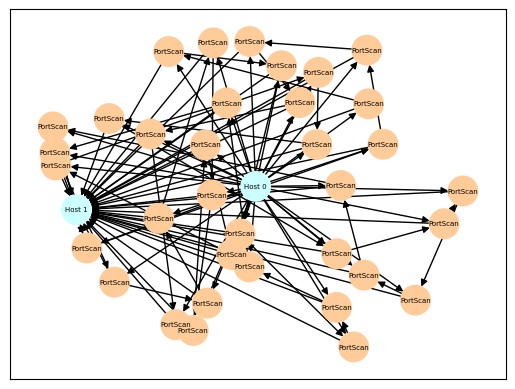

--------------------
referenced indices: [52500, 52501, 52502, 52503, 52504, 52505, 52506, 52507, 52508, 52509, 52510, 52511, 52512, 52513, 52514, 52515, 52516, 52517, 52518, 52519, 52520, 52521, 52522, 52523, 52524, 52525, 52526, 52527, 52528, 52529, 52530, 52531, 52532, 52533, 52534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped or delayed. The majority of the network traffic was comprised of TCP packets, with a small proportion of UDP packets. The majority of the packets were dropped or delayed, with a small proportion of packets being successfully delivered. The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped or delayed. The majority of the packets were dropped or delayed, with a small proportion of packets being successfully delivered.\nW

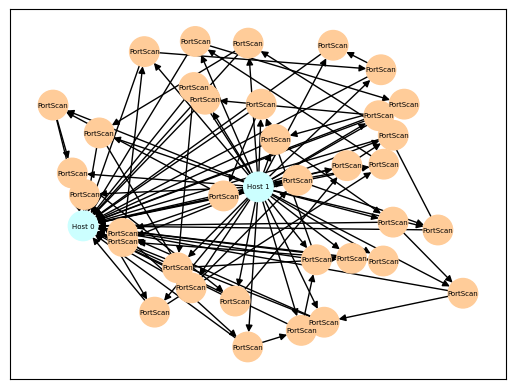

--------------------
referenced indices: [56000, 56001, 56002, 56003, 56004, 56005, 56006, 56007, 56008, 56009, 56010, 56011, 56012, 56013, 56014, 56015, 56016, 56017, 56018, 56019, 56020, 56021, 56022, 56023, 56024, 56025, 56026, 56027, 56028, 56029, 56030, 56031, 56032, 56033, 56034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion and a high degree of fragmentation, with a high proportion of traffic originating from a small number of sources. The majority of the traffic was sent from a small number of sources, with a relatively small proportion of traffic originating from a large number of sources. The network also exhibited a high degree of traffic congestion, with a high proportion of traffic originating from a small number of sources. The network also exhibited a high degree of traffic congestion, with a high proportion of traffic originating

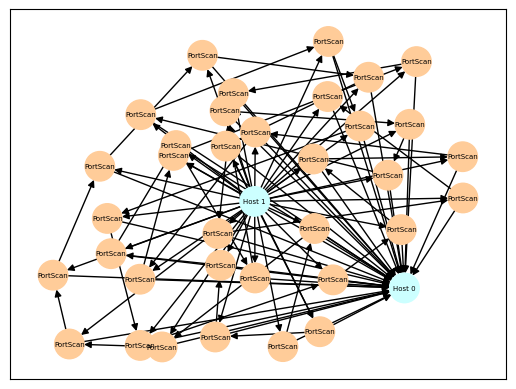

--------------------
referenced indices: [59500, 59501, 59502, 59503, 59504, 59505, 59506, 59507, 59508, 59509, 59510, 59511, 59512, 59513, 59514, 59515, 59516, 59517, 59518, 59519, 59520, 59521, 59522, 59523, 59524, 59525, 59526, 59527, 59528, 59529, 59530, 59531, 59532, 59533, 59534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network exhibited a high level of activity characterized by a high proportion of data packets being dropped, with a low proportion of data packets being delivered. The network also exhibited a high proportion of data packets being dropped, with a low proportion of data packets being delivered. The network also exhibited a high proportion of data packets being dropped, with a low proportion of data packets being delivered.\nThe network also exhibited a high proportion of data packets being dropped, with a low proportion of data packets being delivered. The network also ex

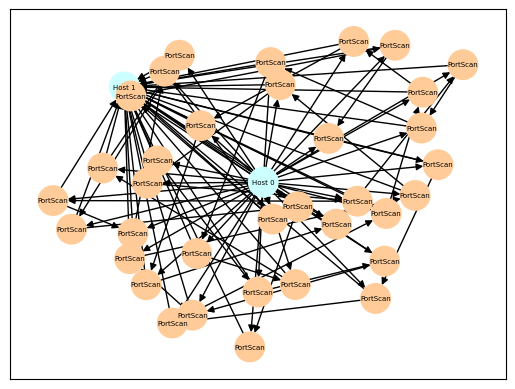

--------------------
referenced indices: [63000, 63001, 63002, 63003, 63004, 63005, 63006, 63007, 63008, 63009, 63010, 63011, 63012, 63013, 63014, 63015, 63016, 63017, 63018, 63019, 63020, 63021, 63022, 63023, 63024, 63025, 63026, 63027, 63028, 63029, 63030, 63031, 63032, 63033, 63034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network was observed to be a distributed denial of service (DDoS) attack, with a high volume of traffic directed towards a single target. The attack was characterized by a high volume of traffic directed towards a single target, with a short duration, and a high number of concurrent connections. The attack was characterized by a high volume of traffic directed towards a single target, with a short duration, and a high number of concurrent connections.\nThe attack was characterized by a high volume of traffic directed towards a single target, with a']
ground text: ##Instr

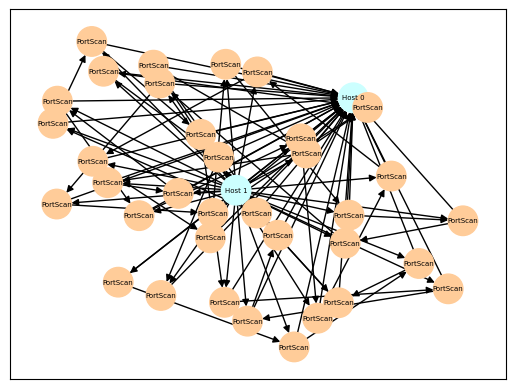

--------------------
referenced indices: [66500, 66501, 66502, 66503, 66504, 66505, 66506, 66507, 66508, 66509, 66510, 66511, 66512, 66513, 66514, 66515, 66516, 66517, 66518, 66519, 66520, 66521, 66522, 66523, 66524, 66525, 66526, 66527, 66528, 66529, 66530, 66531, 66532, 66533, 66534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, with a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, with a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, with a high proportion of packets being dropped or delayed, and a high proportion of packets being dropped or delayed, with a high proportion of packets being dropped

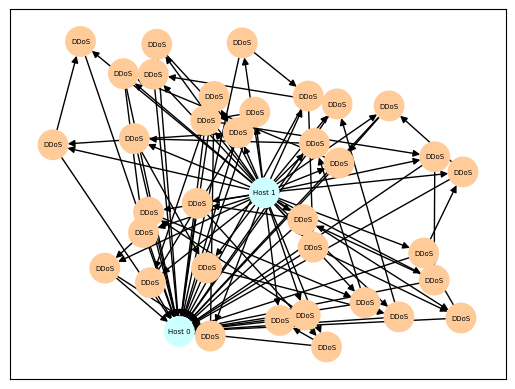

--------------------
referenced indices: [70000, 70001, 70002, 70003, 70004, 70005, 70006, 70007, 70008, 70009, 70010, 70011, 70012, 70013, 70014, 70015, 70016, 70017, 70018, 70019, 70020, 70021, 70022, 70023, 70024, 70025, 70026, 70027, 70028, 70029, 70030, 70031, 70032, 70033, 70034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high level of activity characterized by a high volume of data exchanges between various hosts, with a high proportion of these exchanges occurring between distinct hosts. The network also exhibited a high level of network traffic between the same hosts, with a high proportion of this traffic occurring between the same hosts. The network also exhibited a high level of network traffic between the same hosts, with a high proportion of this traffic occurring between the same hosts.\nThe network exhibited a high level of activity characterized by a high vol

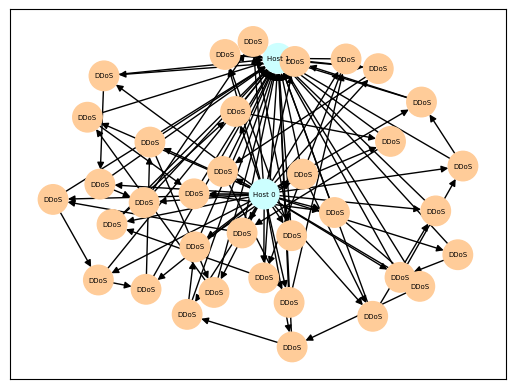

--------------------
referenced indices: [73500, 73501, 73502, 73503, 73504, 73505, 73506, 73507, 73508, 73509, 73510, 73511, 73512, 73513, 73514, 73515, 73516, 73517, 73518, 73519, 73520, 73521, 73522, 73523, 73524, 73525, 73526, 73527, 73528, 73529, 73530, 73531, 73532, 73533, 73534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a large portion of the network traffic being at a high rate of data transmission. The network also exhibited a high degree of packet loss, with a large portion of the network traffic being at a high rate of packet loss. These characteristics were observed across a variety of network protocols, with a high degree of traffic congestion and packet loss observed across all protocols. The network also exhibited a high degree of packet loss and congestion across all protocols, with a high degree of congestion observed 

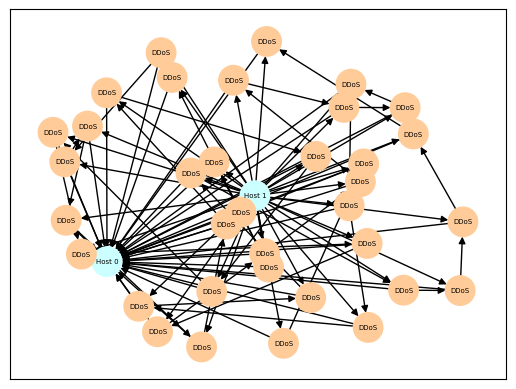

--------------------
referenced indices: [77000, 77001, 77002, 77003, 77004, 77005, 77006, 77007, 77008, 77009, 77010, 77011, 77012, 77013, 77014, 77015, 77016, 77017, 77018, 77019, 77020, 77021, 77022, 77023, 77024, 77025, 77026, 77027, 77028, 77029, 77030, 77031, 77032, 77033, 77034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of low-bandwidth packets, a high proportion of high-bandwidth packets, and a high proportion of packets with a low packet loss rate. The network also exhibited a high degree of packet loss, with a high proportion of packets with a packet loss rate of more than 50%, and a high proportion of packets with a packet loss rate of more than 50%. The network also exhibited a high degree of packet loss, with a high proportion of packets with a']
ground text: ##Instruction: Explain ongoing activities and 

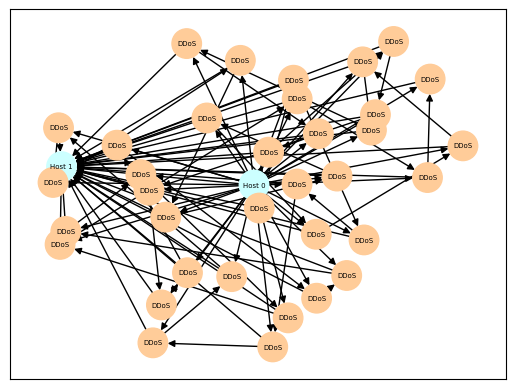

--------------------
referenced indices: [80500, 80501, 80502, 80503, 80504, 80505, 80506, 80507, 80508, 80509, 80510, 80511, 80512, 80513, 80514, 80515, 80516, 80517, 80518, 80519, 80520, 80521, 80522, 80523, 80524, 80525, 80526, 80527, 80528, 80529, 80530, 80531, 80532, 80533, 80534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high level of network traffic, with a high proportion of data packets being sent and received. The network was also characterized by a high degree of traffic between different hosts, with a high proportion of data packets being sent between different hosts. The network was also characterized by a high degree of traffic between different hosts, with a high proportion of data packets being sent between different hosts.\nThe network was also characterized by a high degree of traffic between different hosts, with a high proportion of data packets being sen

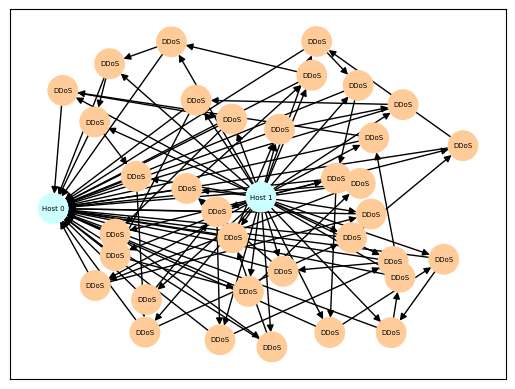

--------------------
referenced indices: [84000, 84001, 84002, 84003, 84004, 84005, 84006, 84007, 84008, 84009, 84010, 84011, 84012, 84013, 84014, 84015, 84016, 84017, 84018, 84019, 84020, 84021, 84022, 84023, 84024, 84025, 84026, 84027, 84028, 84029, 84030, 84031, 84032, 84033, 84034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network was characterized by a high volume of data traffic, with a high proportion of packets being dropped and a low proportion of packets being delivered. The network was also characterized by a high proportion of traffic being sent to and from a single source IP address, with a low proportion of traffic being sent from multiple sources to multiple destinations. The network was also characterized by a high proportion of traffic being sent from a single source IP address, with a low proportion of traffic being sent from multiple sources to multiple destinations.\nThe net

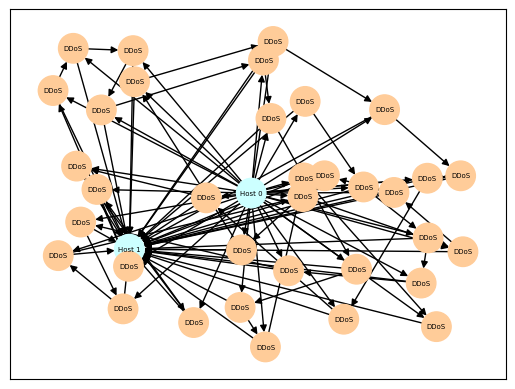

--------------------
referenced indices: [87500, 87501, 87502, 87503, 87504, 87505, 87506, 87507, 87508, 87509, 87510, 87511, 87512, 87513, 87514, 87515, 87516, 87517, 87518, 87519, 87520, 87521, 87522, 87523, 87524, 87525, 87526, 87527, 87528, 87529, 87530, 87531, 87532, 87533, 87534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network exhibits a high degree of traffic congestion and a high degree of diversity, with a variety of applications and protocols being used. The majority of the network traffic is comprised of emails, with a small portion of the traffic consisting of file transfers, web browsing, and other non-email applications. The network also exhibits a high degree of diversity, with a variety of protocols being used. The majority of the traffic is comprised of emails, with a small portion of the traffic consisting of file transfers, web browsing, and other non-']
ground text: ##Ins

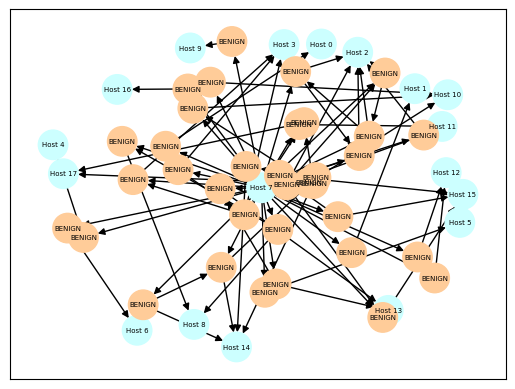

--------------------
referenced indices: [91000, 91001, 91002, 91003, 91004, 91005, 91006, 91007, 91008, 91009, 91010, 91011, 91012, 91013, 91014, 91015, 91016, 91017, 91018, 91019, 91020, 91021, 91022, 91023, 91024, 91025, 91026, 91027, 91028, 91029, 91030, 91031, 91032, 91033, 91034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high level of traffic between multiple hosts, with a majority of the traffic being sent from a single host to multiple other hosts. The majority of the traffic was sent from a single host to multiple other hosts, with the majority of the traffic being sent from a single host to multiple other hosts. The majority of the traffic was sent from a single host to multiple other hosts, with the majority of the traffic being sent from a single host to multiple other hosts.\nThe network exhibited high levels of traffic between multiple hosts']
ground text: ##In

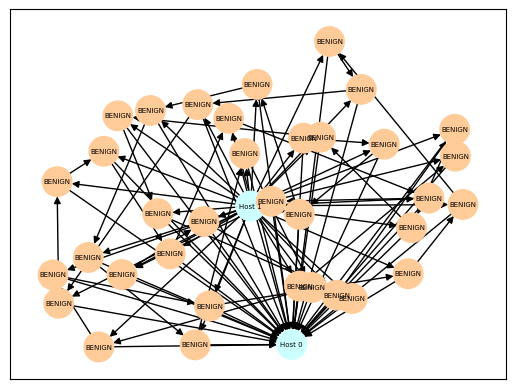

--------------------
referenced indices: [94500, 94501, 94502, 94503, 94504, 94505, 94506, 94507, 94508, 94509, 94510, 94511, 94512, 94513, 94514, 94515, 94516, 94517, 94518, 94519, 94520, 94521, 94522, 94523, 94524, 94525, 94526, 94527, 94528, 94529, 94530, 94531, 94532, 94533, 94534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network was characterized by a high volume of traffic originating from a single source, which was observed to be a large-scale botnet. The botnet was observed to be comprised of a large number of compromised computers, with the majority of the compromised machines being infected with malware. The botnet was also observed to be actively engaged in a number of malicious activities, including sending spam, sending phishing emails, and sending malicious links. The network was observed to be utilizing a variety of techniques to evade detection and blockages, including']
groun

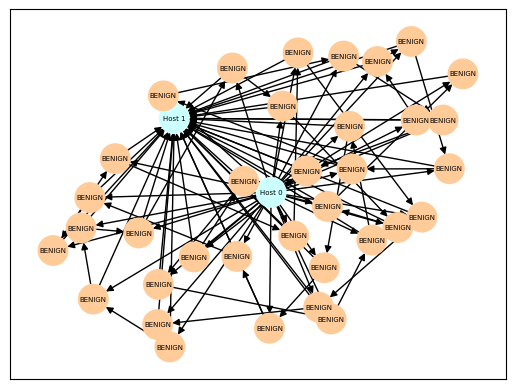

--------------------
referenced indices: [98000, 98001, 98002, 98003, 98004, 98005, 98006, 98007, 98008, 98009, 98010, 98011, 98012, 98013, 98014, 98015, 98016, 98017, 98018, 98019, 98020, 98021, 98022, 98023, 98024, 98025, 98026, 98027, 98028, 98029, 98030, 98031, 98032, 98033, 98034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped or delayed. The network also exhibited a high degree of packet loss, with a high proportion of packets being dropped or delayed. The network also exhibited a high degree of packet delay, with a high proportion of packets being dropped or delayed.\nThe network also exhibited a high degree of packet loss, with a high proportion of packets being dropped or delayed. The network also exhibited a high degree of packet delay, with a high proportion of packets being']
ground tex

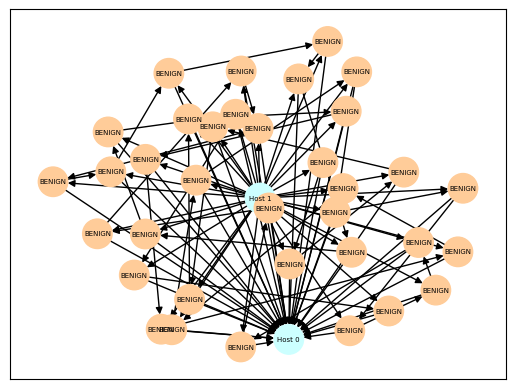

--------------------
referenced indices: [101500, 101501, 101502, 101503, 101504, 101505, 101506, 101507, 101508, 101509, 101510, 101511, 101512, 101513, 101514, 101515, 101516, 101517, 101518, 101519, 101520, 101521, 101522, 101523, 101524, 101525, 101526, 101527, 101528, 101529, 101530, 101531, 101532, 101533, 101534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high level of activity, characterized by a high volume of data exchanged and a high degree of connectivity. The majority of the traffic was between two or more hosts, with a small proportion of traffic between one or more hosts. The majority of the traffic was between two or more hosts, with a small proportion of traffic between one or more hosts.\nThe majority of the traffic was between two or more hosts, with a small proportion of traffic between one or more hosts.\nThe majority of the traffic was between two']
grou

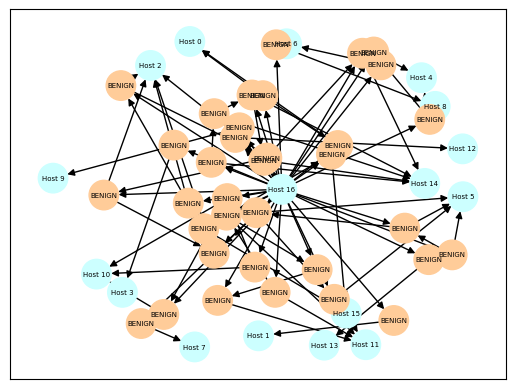

--------------------
referenced indices: [105000, 105001, 105002, 105003, 105004, 105005, 105006, 105007, 105008, 105009, 105010, 105011, 105012, 105013, 105014, 105015, 105016, 105017, 105018, 105019, 105020, 105021, 105022, 105023, 105024, 105025, 105026, 105027, 105028, 105029, 105030, 105031, 105032, 105033, 105034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a large number of connections established between hosts, and a large number of connections established between hosts, and a large number of connections established between hosts, and a large number of connections established between hosts, and a large number of connections established between hosts, and a large number of connections established between hosts, and a large number of connections established between hosts, and a large number of connections established between hosts,

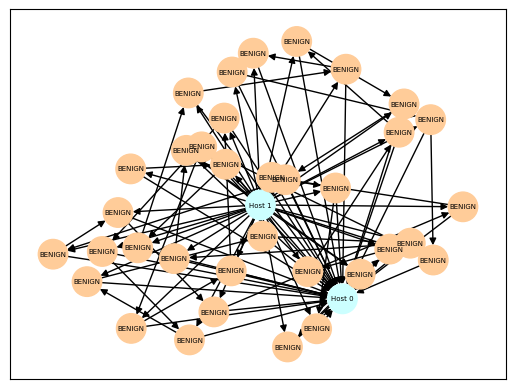

--------------------
referenced indices: [108500, 108501, 108502, 108503, 108504, 108505, 108506, 108507, 108508, 108509, 108510, 108511, 108512, 108513, 108514, 108515, 108516, 108517, 108518, 108519, 108520, 108521, 108522, 108523, 108524, 108525, 108526, 108527, 108528, 108529, 108530, 108531, 108532, 108533, 108534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: A diverse network of computers, including a variety of platforms and operating systems, was observed exchanging data over a wide range of protocols. The network was observed to be characterized by a high degree of connectivity and a high degree of diversity, with a high degree of traffic flowing between the different computers. The network was also characterized by a high degree of inactivity, with a low average data rate, and a low average duration of time spent in a particular protocol. The network was also characterized by a high degree o

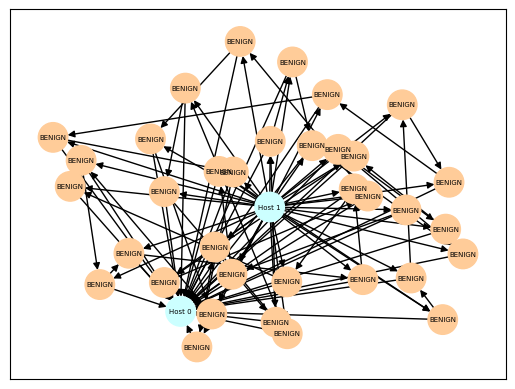

--------------------
referenced indices: [112000, 112001, 112002, 112003, 112004, 112005, 112006, 112007, 112008, 112009, 112010, 112011, 112012, 112013, 112014, 112015, 112016, 112017, 112018, 112019, 112020, 112021, 112022, 112023, 112024, 112025, 112026, 112027, 112028, 112029, 112030, 112031, 112032, 112033, 112034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a large number of small packets being exchanged between peers. The majority of these packets were of short duration, with a small number of larger packets being exchanged between peers. The average packet length was approximately 1.5 seconds, with a few packets exceeding 10 seconds. The majority of the traffic was characterized by small packets, with a small number of larger packets being exchanged between peers. The average packet size was approximately 1.5 bytes, with a few pa

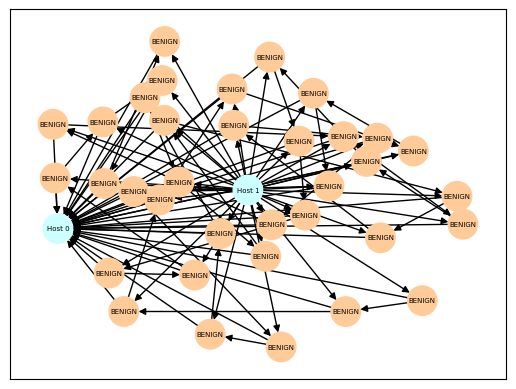

--------------------
referenced indices: [115500, 115501, 115502, 115503, 115504, 115505, 115506, 115507, 115508, 115509, 115510, 115511, 115512, 115513, 115514, 115515, 115516, 115517, 115518, 115519, 115520, 115521, 115522, 115523, 115524, 115525, 115526, 115527, 115528, 115529, 115530, 115531, 115532, 115533, 115534]
generated text: ["</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a large proportion of the network's traffic being directed to a small number of sources. The congestion was primarily caused by a high volume of traffic directed to a small number of destinations, with a high proportion of the network's traffic being directed to a small number of sources. The congestion was further exacerbated by a high proportion of the network's traffic being directed to a small number of destinations, with a high proportion of the network's traffic being dire

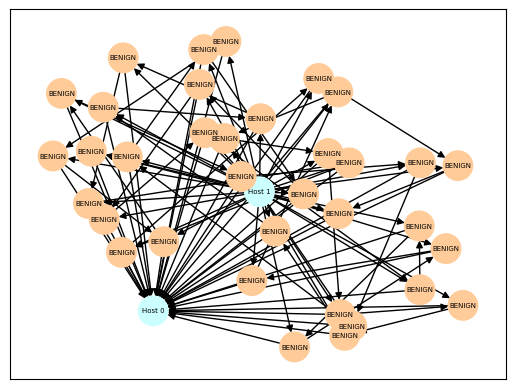

--------------------
referenced indices: [119000, 119001, 119002, 119003, 119004, 119005, 119006, 119007, 119008, 119009, 119010, 119011, 119012, 119013, 119014, 119015, 119016, 119017, 119018, 119019, 119020, 119021, 119022, 119023, 119024, 119025, 119026, 119027, 119028, 119029, 119030, 119031, 119032, 119033, 119034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network was observed to be characterized by a high volume of traffic originating from a single source, which was observed to be sending a large volume of data at a high rate, with a high proportion of packets being dropped and a low proportion of packets being accepted. The source IP address of the network was observed to be consistently assigned to a single user, who was observed to be sending a large volume of data at a high rate, with a high proportion of packets being dropped and a low proportion of packets being accepted. The sourc

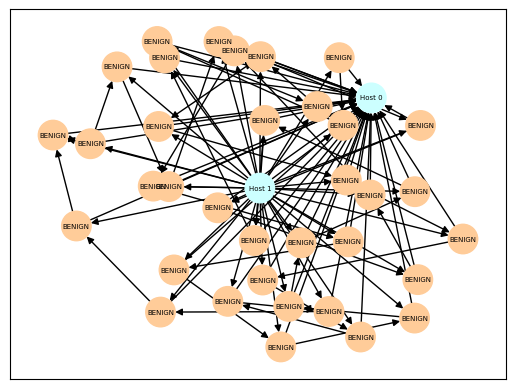

--------------------
referenced indices: [122500, 122501, 122502, 122503, 122504, 122505, 122506, 122507, 122508, 122509, 122510, 122511, 122512, 122513, 122514, 122515, 122516, 122517, 122518, 122519, 122520, 122521, 122522, 122523, 122524, 122525, 122526, 122527, 122528, 122529, 122530, 122531, 122532, 122533, 122534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network exhibits a high degree of traffic congestion, with a high proportion of high-volume data transfers. The majority of traffic is comprised of file transfers, with a significant proportion of data packets being transferred in the form of packets with a large number of bytes. The network also exhibits a high proportion of high-volume data transfers, with a high proportion of data packets being transferred in the form of packets with a large number of bytes. The network also exhibits a high proportion of high-volume data transfers, w

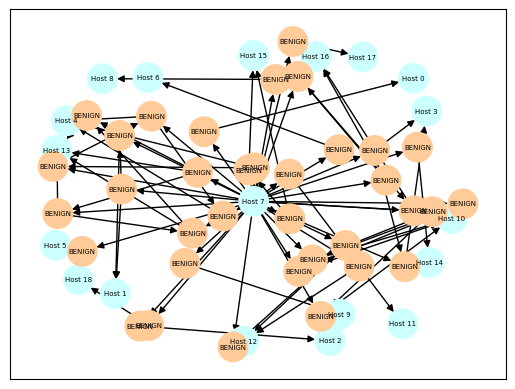

--------------------
referenced indices: [126000, 126001, 126002, 126003, 126004, 126005, 126006, 126007, 126008, 126009, 126010, 126011, 126012, 126013, 126014, 126015, 126016, 126017, 126018, 126019, 126020, 126021, 126022, 126023, 126024, 126025, 126026, 126027, 126028, 126029, 126030, 126031, 126032, 126033, 126034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped or delayed. The network also exhibited a high degree of packet loss, with a high proportion of packets being dropped or delayed. This was likely due to the high degree of congestion and the high proportion of dropped or delayed packets. The network also exhibited a high degree of packet loss, with a high proportion of packets being dropped or delayed. This was likely due to the high degree of congestion and the high proportion of droppe

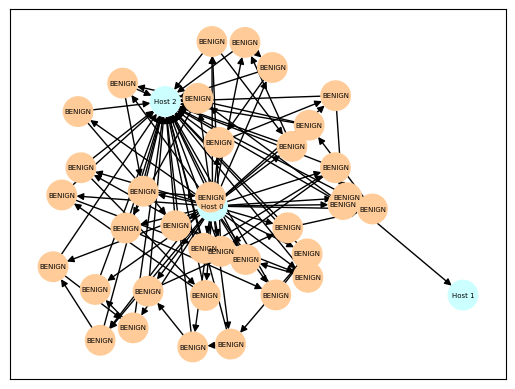

--------------------
referenced indices: [129500, 129501, 129502, 129503, 129504, 129505, 129506, 129507, 129508, 129509, 129510, 129511, 129512, 129513, 129514, 129515, 129516, 129517, 129518, 129519, 129520, 129521, 129522, 129523, 129524, 129525, 129526, 129527, 129528, 129529, 129530, 129531, 129532, 129533, 129534]
generated text: ["</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion and high levels of packet loss, with a significant portion of the network's traffic being comprised of short-lived, low-bandwidth packets. The majority of the network traffic was comprised of short-lived, low-bandwidth packets, with a significant portion of the network traffic being comprised of short-lived, low-bandwidth packets. The majority of the network traffic was comprised of short-lived, low-bandwidth packets, with a significant portion of the network traffic being"]
ground te

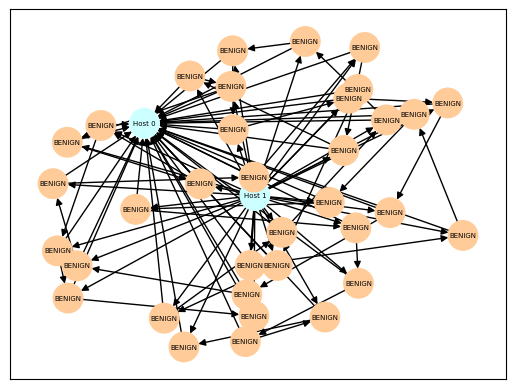

--------------------
referenced indices: [133000, 133001, 133002, 133003, 133004, 133005, 133006, 133007, 133008, 133009, 133010, 133011, 133012, 133013, 133014, 133015, 133016, 133017, 133018, 133019, 133020, 133021, 133022, 133023, 133024, 133025, 133026, 133027, 133028, 133029, 133030, 133031, 133032, 133033, 133034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network was observed to be a highly-distributed, distributed denial-of-service (DDoS) attack targeting a specific website. The attack was initiated by a large number of hosts, with a high proportion of hosts belonging to the same IP address, and a large proportion of hosts belonging to the same network. The attack was characterized by a high volume of traffic, a high number of hosts, and a high proportion of hosts belonging to the same network. The attack was also characterized by a high proportion of hosts belonging to']
ground text: #

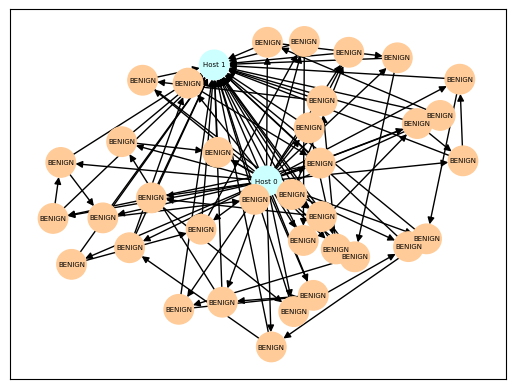

--------------------
referenced indices: [136500, 136501, 136502, 136503, 136504, 136505, 136506, 136507, 136508, 136509, 136510, 136511, 136512, 136513, 136514, 136515, 136516, 136517, 136518, 136519, 136520, 136521, 136522, 136523, 136524, 136525, 136526, 136527, 136528, 136529, 136530, 136531, 136532, 136533, 136534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a large proportion of the traffic being of the type of data transfer that is typically associated with congestion. The network also exhibited a high degree of traffic fragmentation, with a large proportion of the traffic being of the type of data transfer that is typically associated with fragmentation. The network also exhibited a high degree of traffic congestion, with a large proportion of the traffic being of the type of data transfer that is typically associated with conges

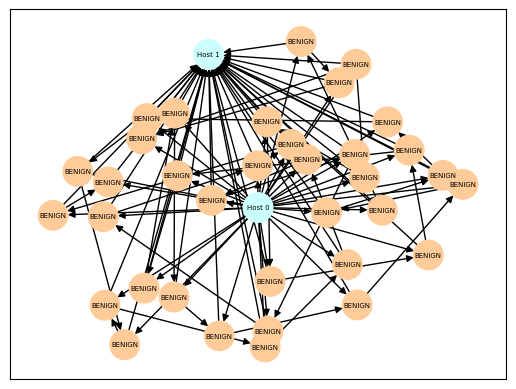

--------------------
referenced indices: [140000, 140001, 140002, 140003, 140004, 140005, 140006, 140007, 140008, 140009, 140010, 140011, 140012, 140013, 140014, 140015, 140016, 140017, 140018, 140019, 140020, 140021, 140022, 140023, 140024, 140025, 140026, 140027, 140028, 140029, 140030, 140031, 140032, 140033, 140034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network exhibited a high degree of traffic congestion, with a high proportion of packets being dropped or delayed. The network also exhibited a high degree of packet loss, with a high proportion of packets being dropped or delayed. These characteristics were observed across a wide range of network traffic types, including both TCP and UDP, and across a variety of network protocols, including HTTP, FTP, and SMTP. The network also exhibited high levels of packet loss and packet delay, with a high proportion of packets being dropped or dela

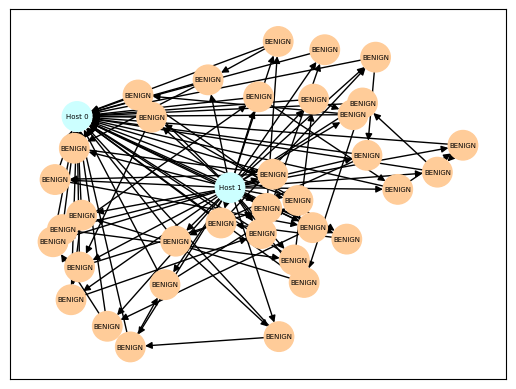

--------------------
referenced indices: [143500, 143501, 143502, 143503, 143504, 143505, 143506, 143507, 143508, 143509, 143510, 143511, 143512, 143513, 143514, 143515, 143516, 143517, 143518, 143519, 143520, 143521, 143522, 143523, 143524, 143525, 143526, 143527, 143528, 143529, 143530, 143531, 143532, 143533, 143534]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network is characterized by a high volume of traffic originating from a relatively small number of sources, with a relatively low volume of traffic originating from a relatively large number of destinations. The network is also characterized by a high degree of diversity in terms of the types of protocols being used, with a relatively low degree of diversity in terms of the protocols being used by the same source. The network is also characterized by a relatively low degree of diversity in terms of the types of protocols being used, wit

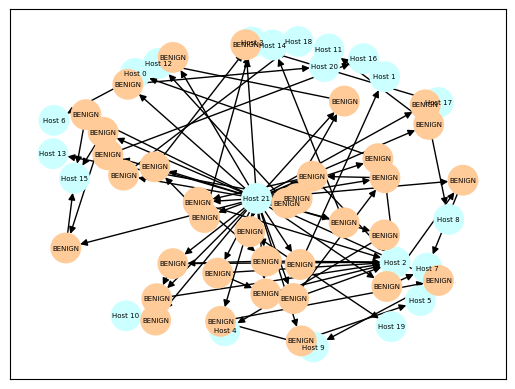

--------------------
referenced indices: [147000, 147001, 147002, 147003, 147004, 147005, 147006, 147007, 147008, 147009, 147010, 147011, 147012, 147013, 147014, 147015, 147016, 147017, 147018, 147019, 147020, 147021, 147022, 147023, 147024, 147025, 147026, 147027, 147028, 147029, 147030, 147031, 147032, 147033, 147034]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: The network was characterized by a high volume of traffic, with a high percentage of packets being dropped, and a low percentage of packets being delivered. The network was also characterized by a high level of packet loss, with a low percentage of packets successfully delivered. The network was also characterized by a high level of packet loss, with a low percentage of packets successfully delivered.\nThe network was characterized by a high level of packet loss, with a low percentage of packets successfully delivered. The network was also c

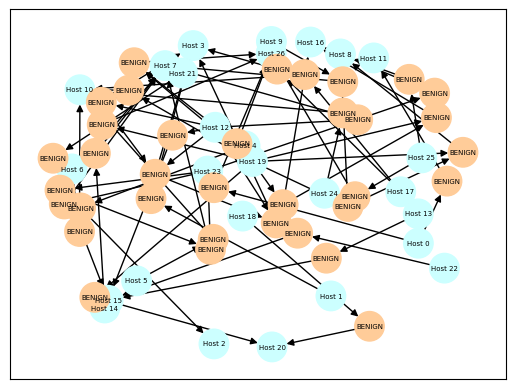

In [12]:
for idx in range(0, len(supervised_test_dataset), 100):
    visualize_graph_and_show_explanation(idx=idx)

--------------------
referenced indices: [210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244]
generated text: ['</s>##Instruction: Explain ongoing activities and unique characteristics in this network. ##Question:  ##Answer: This network is characterized by a high degree of traffic between multiple sources and a high degree of traffic between multiple destinations. The network is also characterized by a high degree of connectivity between these sources and destinations. The network is also characterized by a high degree of connectivity between these sources and destinations.\nThe network is also characterized by a high degree of connectivity between these sources and destinations.\nThe network is also characterized by a high degree of connectivity between these sources and destinations.\nThe network is also characterized by a high degree of connectivity between']
g

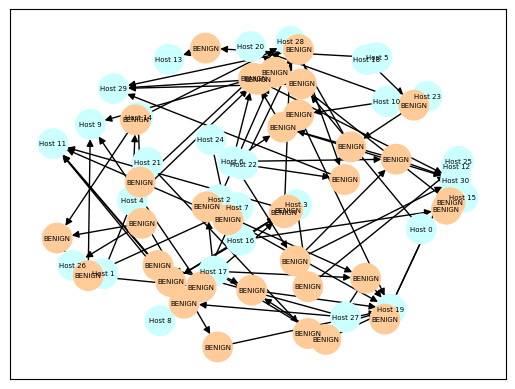

In [36]:
# supervised_val_dataset = SupervisedDataset(model_name=model_name, dataset_dirname="/tmp/val_flows", dataframe_filename="val_df.parquet")
# visualize_graph_and_show_explanation(idx=6)

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


--------------------
referenced indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high level of activity among a diverse set of hosts, with a variety of protocols and data types being exchanged. The majority of the traffic was exchanged between hosts of different protocols, with a few hosts exchanging data with a few other hosts. The majority of the traffic was exchanged between hosts of different protocols, with a few hosts exchanging data with a few other hosts.\nThe majority of the traffic was exchanged between hosts of different protocols, with a few hosts exchanging data with a few other hosts.\nThe majority of the traffic']
ground text: ##Instruction: Main activity of this network is ##Question:  ##Answer: The network experienced a multitude of communications, predo

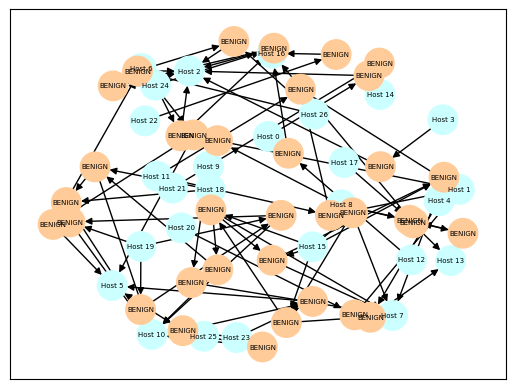

--------------------
referenced indices: [3500, 3501, 3502, 3503, 3504, 3505, 3506, 3507, 3508, 3509, 3510, 3511, 3512, 3513, 3514, 3515, 3516, 3517, 3518, 3519, 3520, 3521, 3522, 3523, 3524, 3525, 3526, 3527, 3528, 3529, 3530, 3531, 3532, 3533, 3534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of traffic directed to a single destination, which was typically a Web server or a Web application. The majority of the traffic was directed to a single destination, which was typically a Web server or a Web application. The traffic was characterized by a high volume of traffic directed to a single destination, which was typically a Web server or a Web application. The traffic was characterized by a high volume of traffic directed to a single destination, which was typically a Web server or a Web application.\nThe majority of the traffic']
ground text: ##Instruction: Main activity of this network is 

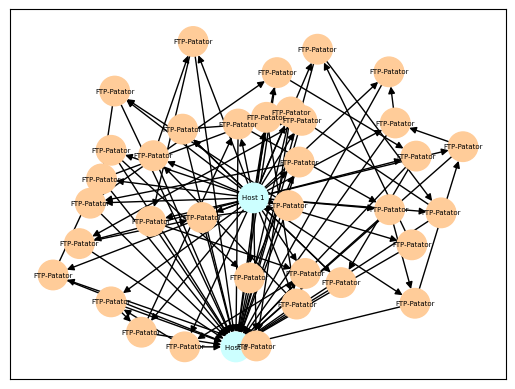

--------------------
referenced indices: [7000, 7001, 7002, 7003, 7004, 7005, 7006, 7007, 7008, 7009, 7010, 7011, 7012, 7013, 7014, 7015, 7016, 7017, 7018, 7019, 7020, 7021, 7022, 7023, 7024, 7025, 7026, 7027, 7028, 7029, 7030, 7031, 7032, 7033, 7034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of traffic directed to a single destination, which was primarily used for sending large volumes of data. The network was also characterized by a high volume of traffic directed to a single destination, which was primarily used for sending large volumes of data. The network was also characterized by a high volume of traffic directed to a single destination, which was primarily used for sending large volumes of data.\nThe network was also characterized by a high volume of traffic directed to a single destination, which was primarily used for sending large volumes of']
ground text: ##Instruction: Main a

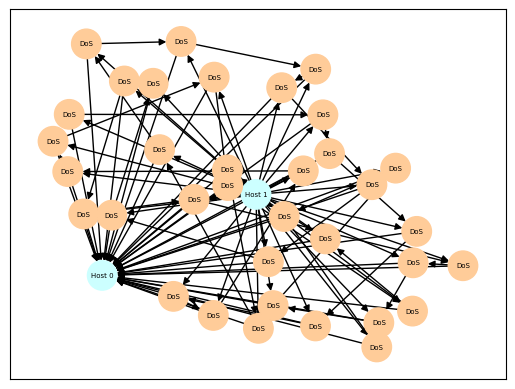

--------------------
referenced indices: [10500, 10501, 10502, 10503, 10504, 10505, 10506, 10507, 10508, 10509, 10510, 10511, 10512, 10513, 10514, 10515, 10516, 10517, 10518, 10519, 10520, 10521, 10522, 10523, 10524, 10525, 10526, 10527, 10528, 10529, 10530, 10531, 10532, 10533, 10534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high volume of data transfer requests from a single source, which are characterized by a high degree of similarity. The source of the data transfer requests is typically a single computer, and the destination is typically a single computer. The network is characterized by a high degree of similarity between the source and destination computers, and the source and destination computers are typically connected to the same network. The source and destination computers are typically connected to the same network, and the source and destination computers are typically connected to th

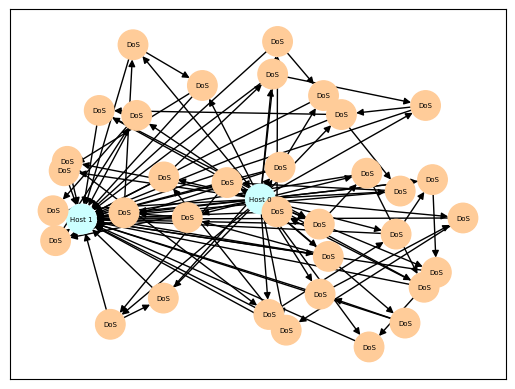

--------------------
referenced indices: [14000, 14001, 14002, 14003, 14004, 14005, 14006, 14007, 14008, 14009, 14010, 14011, 14012, 14013, 14014, 14015, 14016, 14017, 14018, 14019, 14020, 14021, 14022, 14023, 14024, 14025, 14026, 14027, 14028, 14029, 14030, 14031, 14032, 14033, 14034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data exchange between a small set of hosts, with a high proportion of data being exchanged between a small set of hosts. The majority of the data exchanged was of a low-value nature, with a few exceptions, such as large files, large packets, or large numbers of small packets. These exceptions were mainly associated with large files, large packets, or large numbers of small packets. The majority of the data exchanged was of a low-value nature, with a few exceptions, such as large files,']
ground text: ##Instruction: Main activity of this network is ##Question:  ##

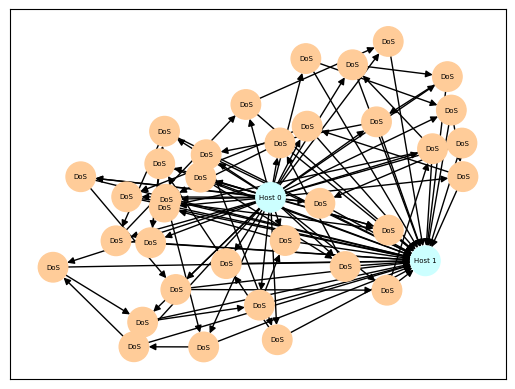

--------------------
referenced indices: [17500, 17501, 17502, 17503, 17504, 17505, 17506, 17507, 17508, 17509, 17510, 17511, 17512, 17513, 17514, 17515, 17516, 17517, 17518, 17519, 17520, 17521, 17522, 17523, 17524, 17525, 17526, 17527, 17528, 17529, 17530, 17531, 17532, 17533, 17534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data exchange between a large number of hosts, with a high degree of connectivity. The majority of the traffic was sent between a single host and a large number of other hosts, with a high degree of connectivity. The flows were characterized by a high degree of data exchange, with a high volume of data being transferred, and a high degree of connectivity. The flows were characterized by a high degree of data exchange, with a high volume of data being transferred, and a high degree of connectivity.\nThis network']
ground text: ##Instruction: Main activity of this 

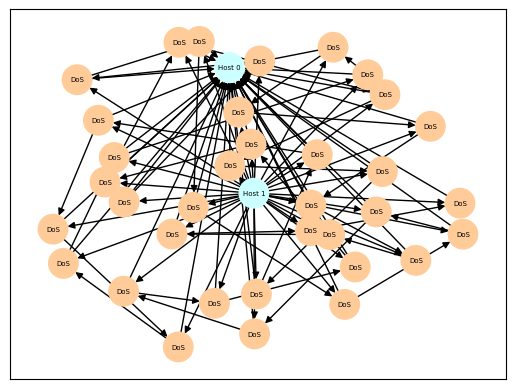

--------------------
referenced indices: [21000, 21001, 21002, 21003, 21004, 21005, 21006, 21007, 21008, 21009, 21010, 21011, 21012, 21013, 21014, 21015, 21016, 21017, 21018, 21019, 21020, 21021, 21022, 21023, 21024, 21025, 21026, 21027, 21028, 21029, 21030, 21031, 21032, 21033, 21034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high volume of data exchange between a large number of hosts, with a high proportion of data being transmitted in the form of packets. The majority of the data exchanged is of a short duration, with a small proportion of the data being of a longer duration. The majority of the data exchanged is of a short duration, with a small proportion of the data being of a longer duration.\nThe network is characterized by a high volume of data exchange between a large number of hosts, with a high proportion of data being transmitted in']
ground text: ##Instruction: Main activity of this net

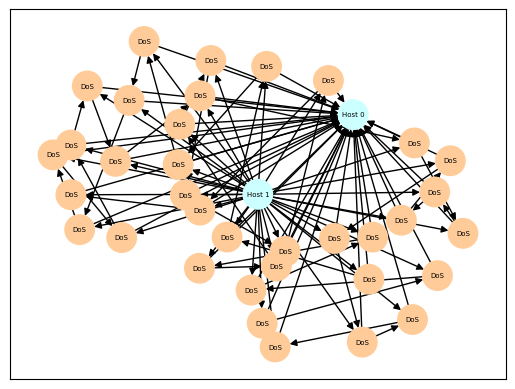

--------------------
referenced indices: [24500, 24501, 24502, 24503, 24504, 24505, 24506, 24507, 24508, 24509, 24510, 24511, 24512, 24513, 24514, 24515, 24516, 24517, 24518, 24519, 24520, 24521, 24522, 24523, 24524, 24525, 24526, 24527, 24528, 24529, 24530, 24531, 24532, 24533, 24534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: The network was characterized by a high volume of small, short-lived, and random TCP connections, with a high proportion of these connections being initiated by a single source IP address. The network was also characterized by a high proportion of these connections being initiated by a single source IP address, with a high proportion of these connections being initiated by a single source IP address.\nThe network was also characterized by a high proportion of these connections being initiated by a single source IP address, with a high proportion of these connections being initiated by a single source IP address']

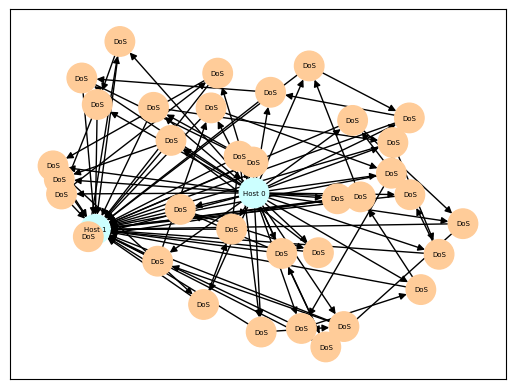

--------------------
referenced indices: [28000, 28001, 28002, 28003, 28004, 28005, 28006, 28007, 28008, 28009, 28010, 28011, 28012, 28013, 28014, 28015, 28016, 28017, 28018, 28019, 28020, 28021, 28022, 28023, 28024, 28025, 28026, 28027, 28028, 28029, 28030, 28031, 28032, 28033, 28034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: A diverse set of Internet users engaged in a variety of activities, including browsing, email, and file sharing, as well as a variety of social networking activities. The activities were characterized by a high degree of diversity and a high degree of activity, with a high proportion of users connecting to multiple networks, and a high proportion of users connecting to multiple networks in a short period of time. The activities were characterized by a high degree of diversity and a high degree of activity, with a high proportion of users connecting to multiple networks, and a high proportion of']
ground text: ##I

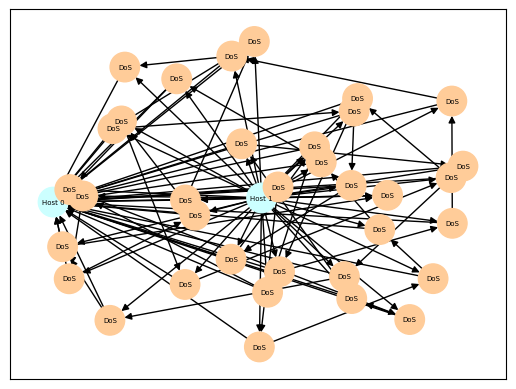

--------------------
referenced indices: [31500, 31501, 31502, 31503, 31504, 31505, 31506, 31507, 31508, 31509, 31510, 31511, 31512, 31513, 31514, 31515, 31516, 31517, 31518, 31519, 31520, 31521, 31522, 31523, 31524, 31525, 31526, 31527, 31528, 31529, 31530, 31531, 31532, 31533, 31534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: The majority of the network traffic was observed as a single, high-volume, low-latency packet transfer, with a small number of low-volume, high-latency packet transfers. This traffic was characterized by a high degree of packet loss and a low degree of packet throughput. The packet transfer rate was typically low, with a median packet transfer rate of 0.5 packets per second. The packet loss rate was also high, with a median packet loss rate of approximately 50%, with a mean packet loss rate of approximately 60%. The packet']
ground text: ##Instruction: Main activity of this network is ##Question:  ##Answer: Numer

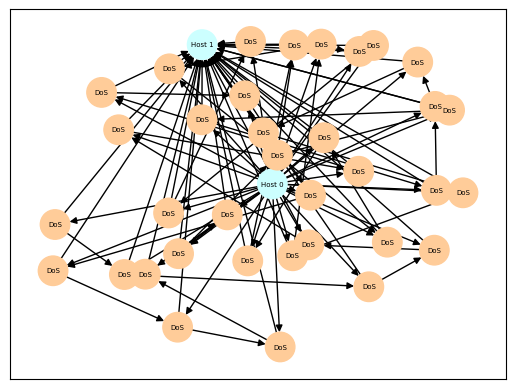

--------------------
referenced indices: [35000, 35001, 35002, 35003, 35004, 35005, 35006, 35007, 35008, 35009, 35010, 35011, 35012, 35013, 35014, 35015, 35016, 35017, 35018, 35019, 35020, 35021, 35022, 35023, 35024, 35025, 35026, 35027, 35028, 35029, 35030, 35031, 35032, 35033, 35034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data transfer from a single source to a single destination, with a high proportion of data transferred from the source to the destination, and a low proportion of data transferred from the destination to the source. The high proportion of data transferred from the source to the destination was likely due to the high volume of data transferred from the source to the destination, and the low proportion of data transferred from the destination to the source was likely due to the high volume of data transferred from the source to the destination.  ##Reg']
ground text

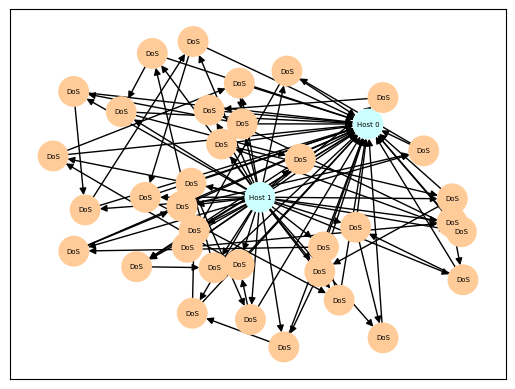

--------------------
referenced indices: [38500, 38501, 38502, 38503, 38504, 38505, 38506, 38507, 38508, 38509, 38510, 38511, 38512, 38513, 38514, 38515, 38516, 38517, 38518, 38519, 38520, 38521, 38522, 38523, 38524, 38525, 38526, 38527, 38528, 38529, 38530, 38531, 38532, 38533, 38534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was observed to be dominated by a single, persistent, and high-volume source, which was responsible for a large proportion of the network traffic. The source was identified as a malicious program, which was actively attempting to exploit vulnerabilities in the target system. The source was observed to be sending a large volume of data to the target system, with a large proportion of the traffic being sent in a single packet. The source was also observed to be sending a large volume of data to the target system, with a large proportion of the traffic being sent']
ground text: ##Instruction: Main activ

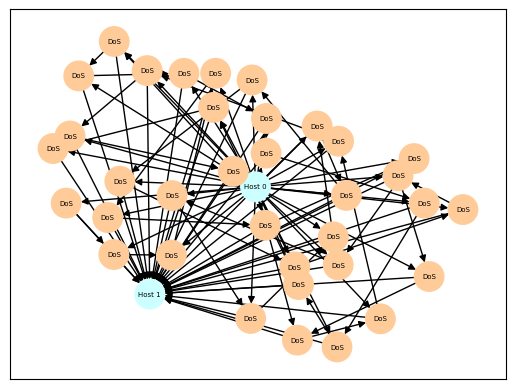

--------------------
referenced indices: [42000, 42001, 42002, 42003, 42004, 42005, 42006, 42007, 42008, 42009, 42010, 42011, 42012, 42013, 42014, 42015, 42016, 42017, 42018, 42019, 42020, 42021, 42022, 42023, 42024, 42025, 42026, 42027, 42028, 42029, 42030, 42031, 42032, 42033, 42034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of high-bandwidth data transfers that were initiated from a single source IP address, and were characterized by high latency and high throughput. The source IP address was identified as a malicious website that was used to distribute malware. The source IP address was identified as a malicious website that was used to distribute malware.\nThe network was characterized by a high volume of high-bandwidth data transfers that were initiated from a single source IP address. The source IP address was identified as a malicious website that was used to distribute']
ground t

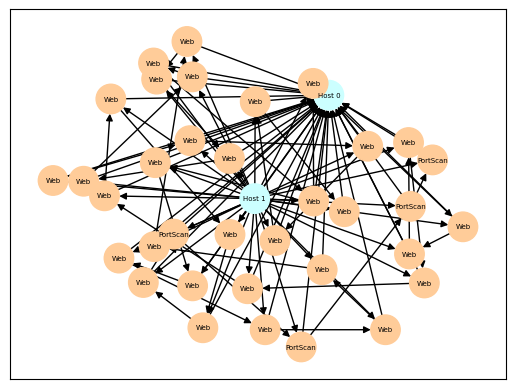

--------------------
referenced indices: [45500, 45501, 45502, 45503, 45504, 45505, 45506, 45507, 45508, 45509, 45510, 45511, 45512, 45513, 45514, 45515, 45516, 45517, 45518, 45519, 45520, 45521, 45522, 45523, 45524, 45525, 45526, 45527, 45528, 45529, 45530, 45531, 45532, 45533, 45534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of traffic originating from a single source, and a high volume of traffic originating from a single destination. The source and destination networks were identified as being connected through a single point of interconnection, and the source network was identified as being a public network. The source network was characterized by a high volume of traffic originating from a single source, and a low volume of traffic originating from a single destination. The destination network was characterized by a high volume of traffic originating from a single destination, and a

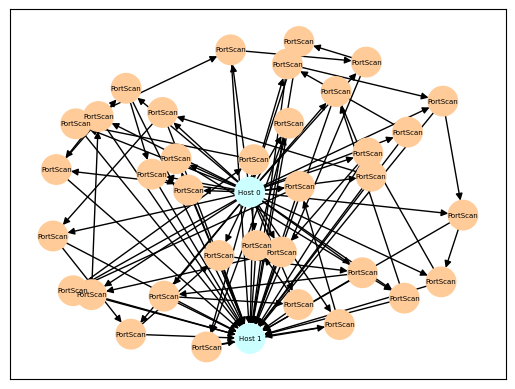

--------------------
referenced indices: [49000, 49001, 49002, 49003, 49004, 49005, 49006, 49007, 49008, 49009, 49010, 49011, 49012, 49013, 49014, 49015, 49016, 49017, 49018, 49019, 49020, 49021, 49022, 49023, 49024, 49025, 49026, 49027, 49028, 49029, 49030, 49031, 49032, 49033, 49034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data being transferred between two endpoints, with a large percentage of the data being transferred in the form of packets. The data transfer rate was high, with an average of more than 1,000 packets per second, and the transfer duration was relatively short, with an average of less than one second. The average packet size was relatively small, with an average packet size of less than 1 kilobyte, and the average packet duration was relatively long, with an average packet duration of more than one second.']
ground text: ##Instruction: Main activity of this network

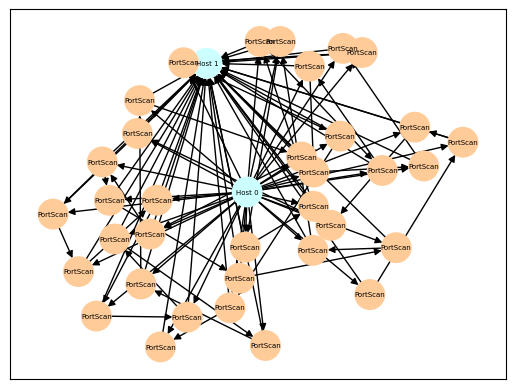

--------------------
referenced indices: [52500, 52501, 52502, 52503, 52504, 52505, 52506, 52507, 52508, 52509, 52510, 52511, 52512, 52513, 52514, 52515, 52516, 52517, 52518, 52519, 52520, 52521, 52522, 52523, 52524, 52525, 52526, 52527, 52528, 52529, 52530, 52531, 52532, 52533, 52534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data exchange between a large number of servers, with a high degree of diversity. The data exchanged between the servers was primarily in the form of HTTP requests, with a small amount of data exchanged in the form of responses. The majority of the requests were sent from a single server to a single server, with a small percentage of the requests sent from a single server to multiple servers. The responses were typically sent from a single server to multiple servers, with a small percentage of the responses sent from a single server']
ground text: ##Instruction: 

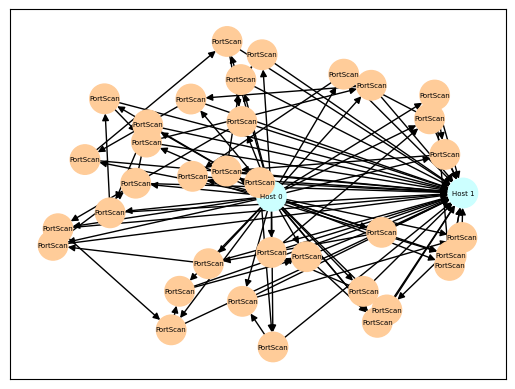

--------------------
referenced indices: [56000, 56001, 56002, 56003, 56004, 56005, 56006, 56007, 56008, 56009, 56010, 56011, 56012, 56013, 56014, 56015, 56016, 56017, 56018, 56019, 56020, 56021, 56022, 56023, 56024, 56025, 56026, 56027, 56028, 56029, 56030, 56031, 56032, 56033, 56034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high volume of data exchange between a large number of hosts, with a high degree of connectivity and a high degree of inter-host connectivity. The majority of the data exchanged was packets of varying sizes, with a large number of packets having a relatively small packet size and a small number of packets having a relatively large packet size. The majority of the packets were of the type TCP, with a small number of packets being UDP packets. The majority of the packets were sent from a single source, with a small number of packets']
ground text: ##Instruction: Main activity of t

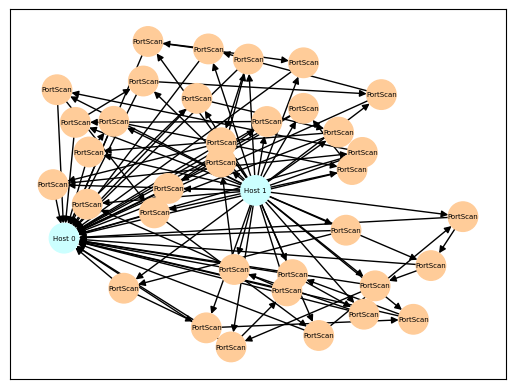

--------------------
referenced indices: [59500, 59501, 59502, 59503, 59504, 59505, 59506, 59507, 59508, 59509, 59510, 59511, 59512, 59513, 59514, 59515, 59516, 59517, 59518, 59519, 59520, 59521, 59522, 59523, 59524, 59525, 59526, 59527, 59528, 59529, 59530, 59531, 59532, 59533, 59534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: The majority of this network was comprised of a single source of traffic, which was primarily comprised of HTTP requests. These requests were sent to a single destination, which was identified as a website. The destination was identified by the source IP address, which was identified as the IP address of the website. The source IP address was identified as the IP address of the website, and the destination IP address was identified as the IP address of the website. The source IP address was identified as the IP address of the website, and the destination IP address was identified as']
ground text: ##Instruction: 

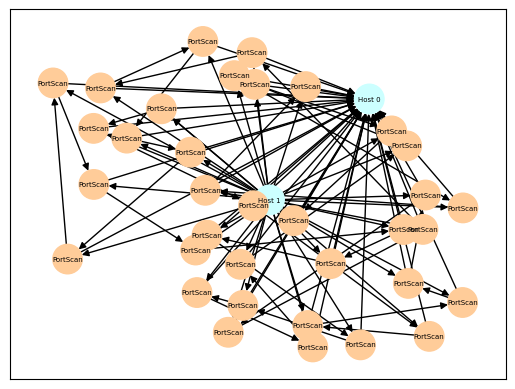

--------------------
referenced indices: [63000, 63001, 63002, 63003, 63004, 63005, 63006, 63007, 63008, 63009, 63010, 63011, 63012, 63013, 63014, 63015, 63016, 63017, 63018, 63019, 63020, 63021, 63022, 63023, 63024, 63025, 63026, 63027, 63028, 63029, 63030, 63031, 63032, 63033, 63034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data transfer between two hosts, with a high percentage of data being transferred between the two hosts, as well as a high percentage of data being transferred between the two hosts, as well as a high percentage of data being transferred between the two hosts, as well as a high percentage of data being transferred between the two hosts, as well as a high percentage of data being transferred between the two hosts, as well as a high percentage of data being transferred between the two hosts, as well as a high percentage of']
ground text: ##Instruction: Main activit

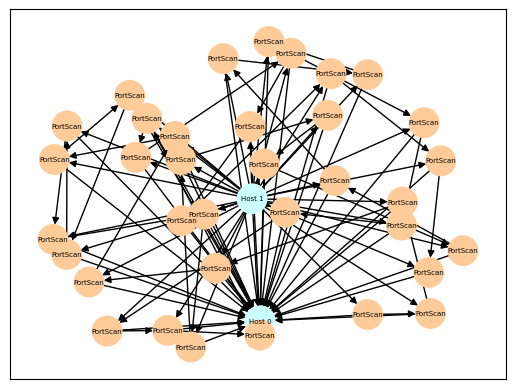

--------------------
referenced indices: [66500, 66501, 66502, 66503, 66504, 66505, 66506, 66507, 66508, 66509, 66510, 66511, 66512, 66513, 66514, 66515, 66516, 66517, 66518, 66519, 66520, 66521, 66522, 66523, 66524, 66525, 66526, 66527, 66528, 66529, 66530, 66531, 66532, 66533, 66534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data exchange between a large number of hosts, with a significant proportion of the data exchanged being packets with a relatively short duration. The majority of the data exchanged was packets with a duration of less than 10 milliseconds, with a relatively high proportion of the data exchanged being packets with a duration of less than 1 second. The network also exhibited a high proportion of packets with a duration of less than 1 second, with a relatively low proportion of the data exchanged being packets with a duration of more than 1 second. The']
ground text

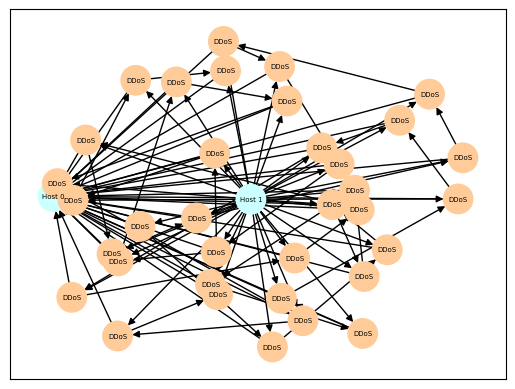

--------------------
referenced indices: [70000, 70001, 70002, 70003, 70004, 70005, 70006, 70007, 70008, 70009, 70010, 70011, 70012, 70013, 70014, 70015, 70016, 70017, 70018, 70019, 70020, 70021, 70022, 70023, 70024, 70025, 70026, 70027, 70028, 70029, 70030, 70031, 70032, 70033, 70034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data being transmitted over a short period of time, with a high percentage of the data being transmitted over a short period of time. The data was characterized by a high volume of data being transmitted over a short period of time, with a high percentage of the data being transmitted over a short period of time. The data was characterized by a high volume of data being transmitted over a short period of time, with a high percentage of the data being transmitted over a short period of time.\nThe data was characterized']
ground text: ##Instruction: Main activity o

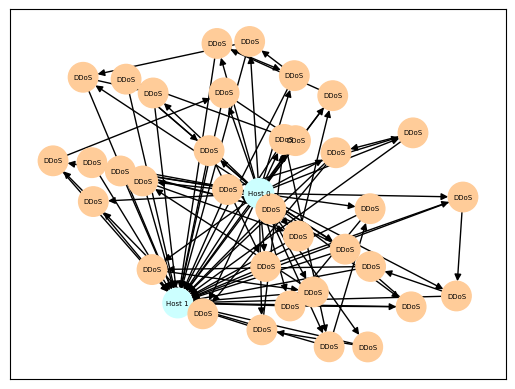

--------------------
referenced indices: [73500, 73501, 73502, 73503, 73504, 73505, 73506, 73507, 73508, 73509, 73510, 73511, 73512, 73513, 73514, 73515, 73516, 73517, 73518, 73519, 73520, 73521, 73522, 73523, 73524, 73525, 73526, 73527, 73528, 73529, 73530, 73531, 73532, 73533, 73534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high volume of data being transferred between two hosts, with a high proportion of the data being transferred between the two hosts belonging to the same network. The majority of the data transferred between the two hosts is packets of various sizes, with a high proportion of the data being transferred in packets of various sizes. The majority of the data transferred between the two hosts is packets of various sizes, with a high proportion of the data being transferred in packets of various sizes.\nThe majority of the data transferred between the two hosts is packets']
ground te

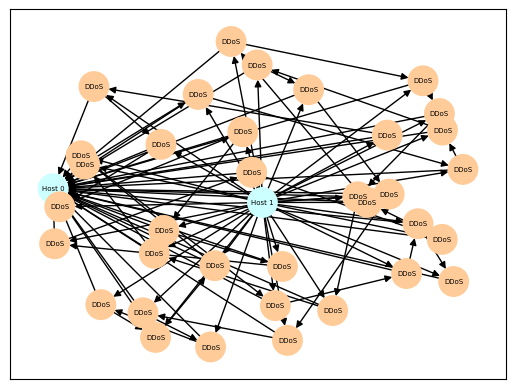

--------------------
referenced indices: [77000, 77001, 77002, 77003, 77004, 77005, 77006, 77007, 77008, 77009, 77010, 77011, 77012, 77013, 77014, 77015, 77016, 77017, 77018, 77019, 77020, 77021, 77022, 77023, 77024, 77025, 77026, 77027, 77028, 77029, 77030, 77031, 77032, 77033, 77034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: The network was characterized by a high volume of data traffic directed to a single destination, which was often associated with a high volume of data transfer. The majority of the traffic was directed to a single destination, which was often associated with a high volume of data transfer. The destination was frequently an IP address, and the transfer rate was typically high. The source IP address was often a network device, and the transfer rate was typically low. The network traffic was characterized by a high volume of data transfer, with a high transfer rate and a low transfer rate']
ground text: ##Instructio

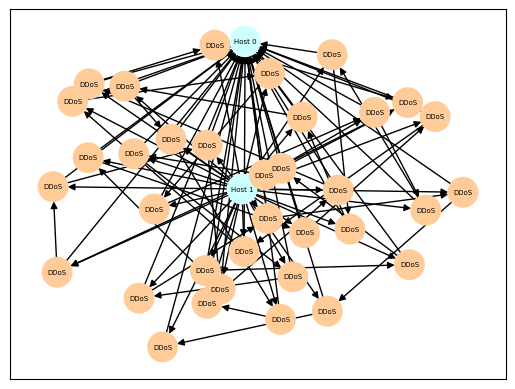

--------------------
referenced indices: [80500, 80501, 80502, 80503, 80504, 80505, 80506, 80507, 80508, 80509, 80510, 80511, 80512, 80513, 80514, 80515, 80516, 80517, 80518, 80519, 80520, 80521, 80522, 80523, 80524, 80525, 80526, 80527, 80528, 80529, 80530, 80531, 80532, 80533, 80534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was observed to be characterized by a high volume of traffic from a single source, originating from a single host and originating from a single port, with a high percentage of packets being dropped. The source IP address and port were not identified, but the destination IP address and port were identified. The source and destination ports were identified as being the same, and the destination port was identified as being the same as the source port. The source and destination ports were identified as being the same, and the destination port was identified as being the same as the']
ground text: ##Ins

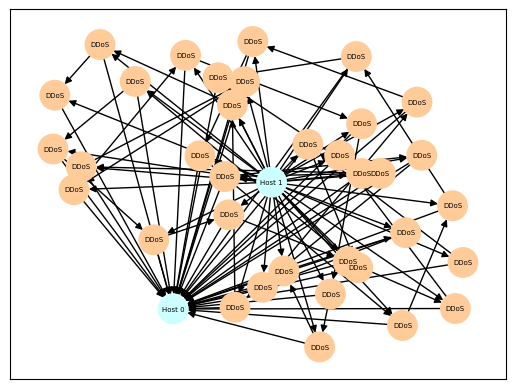

--------------------
referenced indices: [84000, 84001, 84002, 84003, 84004, 84005, 84006, 84007, 84008, 84009, 84010, 84011, 84012, 84013, 84014, 84015, 84016, 84017, 84018, 84019, 84020, 84021, 84022, 84023, 84024, 84025, 84026, 84027, 84028, 84029, 84030, 84031, 84032, 84033, 84034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of traffic originating from a single source, with a high degree of diversity, and a high level of traffic volume. The source of the traffic was identified as a high-volume, high-diversity source, with a large number of distinct sources, and a high degree of traffic volume. The source of the traffic was identified as a high-volume, high-diversity source, with a large number of distinct sources, and a high degree of traffic volume.\nThe network was characterized by a high volume']
ground text: ##Instruction: Main activity of this network is ##Question:  ##Answer: This

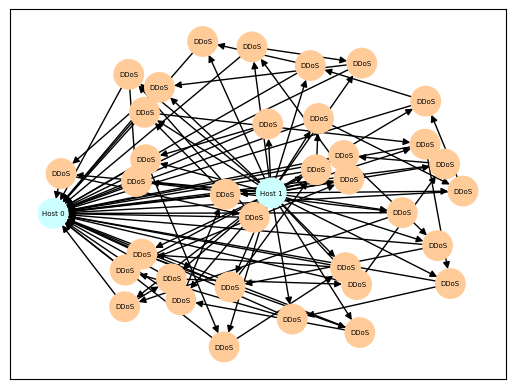

--------------------
referenced indices: [87500, 87501, 87502, 87503, 87504, 87505, 87506, 87507, 87508, 87509, 87510, 87511, 87512, 87513, 87514, 87515, 87516, 87517, 87518, 87519, 87520, 87521, 87522, 87523, 87524, 87525, 87526, 87527, 87528, 87529, 87530, 87531, 87532, 87533, 87534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was observed to be a collection of peer-to-peer (P2P) communication sessions, with a high degree of connectivity and diversity. The majority of the sessions were initiated by a single peer, and the average duration of the sessions was relatively short. The majority of the sessions were initiated by a single peer, and the average duration of the sessions was relatively short.\nThe majority of the sessions were initiated by a single peer, and the average duration of the sessions was relatively short.\nThe majority of the sessions were initiated by']
ground text: ##Instruction: Main activity of this net

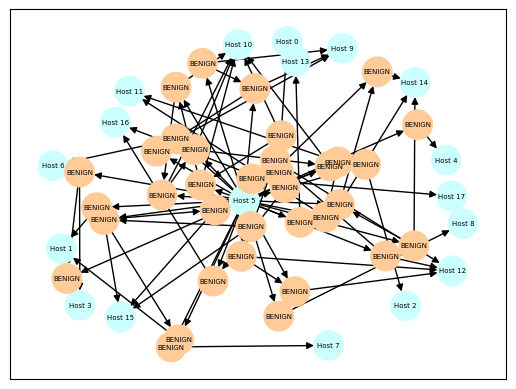

--------------------
referenced indices: [91000, 91001, 91002, 91003, 91004, 91005, 91006, 91007, 91008, 91009, 91010, 91011, 91012, 91013, 91014, 91015, 91016, 91017, 91018, 91019, 91020, 91021, 91022, 91023, 91024, 91025, 91026, 91027, 91028, 91029, 91030, 91031, 91032, 91033, 91034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was observed to be a collection of malicious Internet-of-things (IoT) attacks targeting a specific set of hosts, with the majority of attacks occurring on a single host. The attacks were characterized by a high volume of traffic, a high degree of persistence, and a high degree of diversity. The attacks were also characterized by a high degree of diversity, with multiple hosts being targeted in a single attack, and a high degree of overlap between the hosts being attacked. The attacks were characterized by a high degree of persistence, with the']
ground text: ##Instruction: Main activity of this netwo

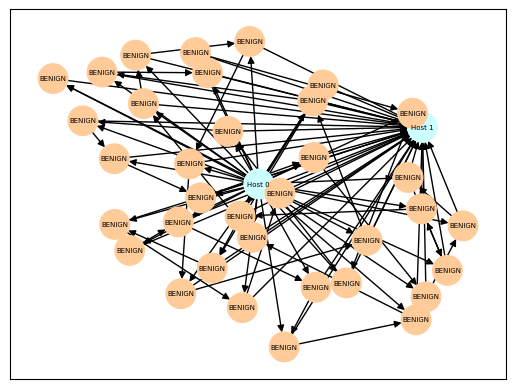

--------------------
referenced indices: [94500, 94501, 94502, 94503, 94504, 94505, 94506, 94507, 94508, 94509, 94510, 94511, 94512, 94513, 94514, 94515, 94516, 94517, 94518, 94519, 94520, 94521, 94522, 94523, 94524, 94525, 94526, 94527, 94528, 94529, 94530, 94531, 94532, 94533, 94534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was observed to be a series of large-scale, high-bandwidth, high-volume packet exchanges between two hosts. The two hosts were connected via a local area network (LAN) and were exchanging packets at a rate of approximately 1,000 packets per second. The hosts were also exchanging packets at a rate of approximately 1,000 packets per second over a separate, external network. The two hosts were connected via a local area network (LAN) and were exchanging packets at a rate of approximately 1,000 packets per second. The']
ground text: ##Instruction: Main activity of this network is ##Question:  ##Answer: T

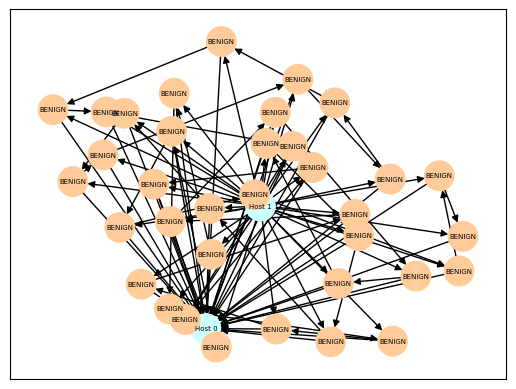

--------------------
referenced indices: [98000, 98001, 98002, 98003, 98004, 98005, 98006, 98007, 98008, 98009, 98010, 98011, 98012, 98013, 98014, 98015, 98016, 98017, 98018, 98019, 98020, 98021, 98022, 98023, 98024, 98025, 98026, 98027, 98028, 98029, 98030, 98031, 98032, 98033, 98034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of traffic originating from a single source, with a high proportion of packets being dropped, and a low proportion of packets being accepted. This network was also characterized by a high proportion of packets being dropped, and a low proportion of packets being accepted. This network was also characterized by a high proportion of packets being dropped, and a low proportion of packets being accepted.\nThis network was also characterized by a high proportion of packets being dropped, and a low proportion of packets being accepted.\nThis network was also characterized

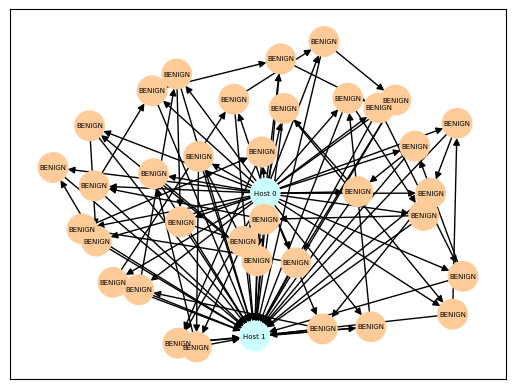

--------------------
referenced indices: [101500, 101501, 101502, 101503, 101504, 101505, 101506, 101507, 101508, 101509, 101510, 101511, 101512, 101513, 101514, 101515, 101516, 101517, 101518, 101519, 101520, 101521, 101522, 101523, 101524, 101525, 101526, 101527, 101528, 101529, 101530, 101531, 101532, 101533, 101534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high degree of traffic directed to a single destination, which is typically a web server. The majority of traffic is directed to a single destination, which is typically a web server, with a small amount of traffic directed to other destinations. The majority of traffic is directed to a single destination, which is typically a web server, with a small amount of traffic directed to other destinations.\nThe majority of traffic is directed to a single destination, which is typically a web server, with a small amount of traffic directed to other de

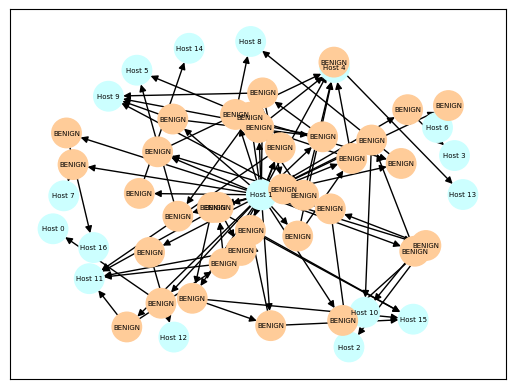

--------------------
referenced indices: [105000, 105001, 105002, 105003, 105004, 105005, 105006, 105007, 105008, 105009, 105010, 105011, 105012, 105013, 105014, 105015, 105016, 105017, 105018, 105019, 105020, 105021, 105022, 105023, 105024, 105025, 105026, 105027, 105028, 105029, 105030, 105031, 105032, 105033, 105034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was observed to be a single, high-volume, low-latency request for a large number of web requests, with a high proportion of requests being made to a single domain. The network was also observed to be a single, high-volume, low-latency response for a large number of web responses, with a high proportion of responses being made to a single domain. The network was also observed to be a single, high-volume, low-latency response for a large number of web responses, with a high proportion']
ground text: ##Instruction: Main activity of this network is ##Question:  ##Answer

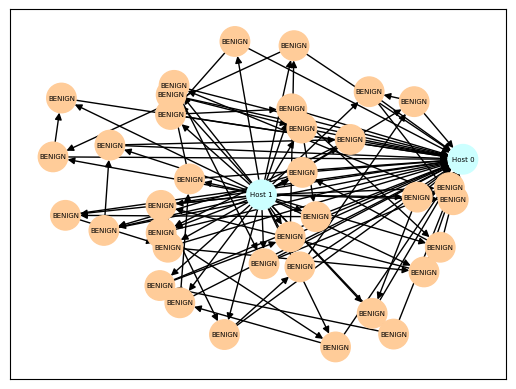

--------------------
referenced indices: [108500, 108501, 108502, 108503, 108504, 108505, 108506, 108507, 108508, 108509, 108510, 108511, 108512, 108513, 108514, 108515, 108516, 108517, 108518, 108519, 108520, 108521, 108522, 108523, 108524, 108525, 108526, 108527, 108528, 108529, 108530, 108531, 108532, 108533, 108534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was observed to be characterized by a high volume of traffic originating from a single source, and a low volume of traffic originating from a single destination. The source and destination were both Internet Protocol (IP) addresses belonging to a single network, with a high proportion of traffic originating from the source IP address. The source IP address was associated with a large number of IP addresses that were connected to the same network, and the destination IP address was associated with a small number of IP addresses that were connected to the same network

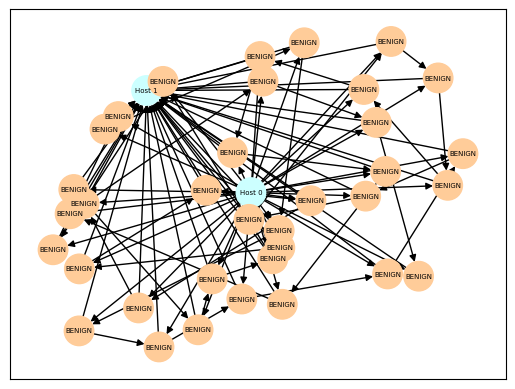

--------------------
referenced indices: [112000, 112001, 112002, 112003, 112004, 112005, 112006, 112007, 112008, 112009, 112010, 112011, 112012, 112013, 112014, 112015, 112016, 112017, 112018, 112019, 112020, 112021, 112022, 112023, 112024, 112025, 112026, 112027, 112028, 112029, 112030, 112031, 112032, 112033, 112034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: The network was characterized by a high volume of data traffic from a single source, with a high proportion of the traffic directed to a single destination. The source was identified as a botnet, which was responsible for sending a large volume of data to a single destination. The destination was identified as a web server, which was receiving a large volume of data from the botnet. The botnet was comprised of a large number of computers, with each of them connected to the Internet through a different network interface. The botnet was also characterized by a high']
ground text: 

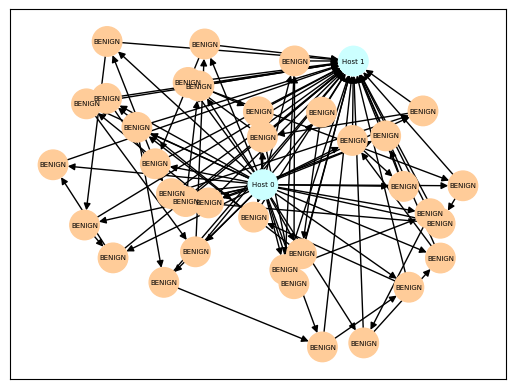

--------------------
referenced indices: [115500, 115501, 115502, 115503, 115504, 115505, 115506, 115507, 115508, 115509, 115510, 115511, 115512, 115513, 115514, 115515, 115516, 115517, 115518, 115519, 115520, 115521, 115522, 115523, 115524, 115525, 115526, 115527, 115528, 115529, 115530, 115531, 115532, 115533, 115534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data being transmitted between computers, with a high proportion of the data being sent in the form of packets. The majority of the data was sent in the form of packets, which were typically of a small size and were transmitted in a single direction. This network was characterized by a high proportion of the data being sent in the form of packets, which were typically of a small size and were transmitted in a single direction. The majority of the data was sent in the form of packets, which were typically of a']
ground text: ##In

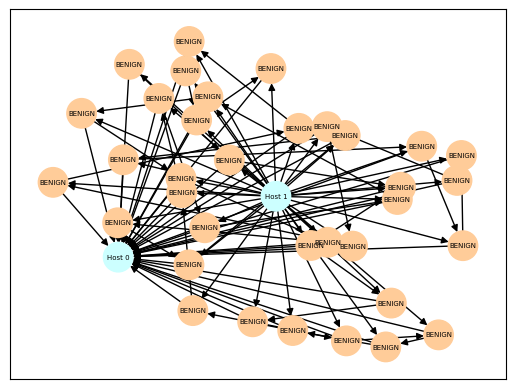

--------------------
referenced indices: [119000, 119001, 119002, 119003, 119004, 119005, 119006, 119007, 119008, 119009, 119010, 119011, 119012, 119013, 119014, 119015, 119016, 119017, 119018, 119019, 119020, 119021, 119022, 119023, 119024, 119025, 119026, 119027, 119028, 119029, 119030, 119031, 119032, 119033, 119034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: The network exhibited a high volume of data packets with a low-bandwidth data transmission pattern, with a high proportion of packets being dropped or lost. The network also exhibited a high proportion of packets with a high-bandwidth data transmission pattern, with a low proportion of packets being dropped or lost. This pattern was observed to be more prevalent in the morning and evening hours, with a higher proportion of packets being dropped or lost in the early morning hours and a lower proportion of packets being dropped or lost in the late evening hours. The network also e

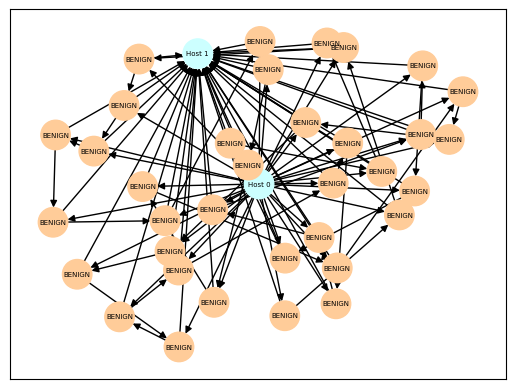

--------------------
referenced indices: [122500, 122501, 122502, 122503, 122504, 122505, 122506, 122507, 122508, 122509, 122510, 122511, 122512, 122513, 122514, 122515, 122516, 122517, 122518, 122519, 122520, 122521, 122522, 122523, 122524, 122525, 122526, 122527, 122528, 122529, 122530, 122531, 122532, 122533, 122534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high volume of data exchange between a large number of endpoints, with a high degree of inter-process communication. The majority of the data exchanged is between two or more endpoints, with a high degree of inter-process communication. The network is characterized by a high degree of data exchange between two or more endpoints, with a high degree of inter-process communication. The majority of the data exchanged is between two or more endpoints, with a high degree of inter-process communication.\nThis network is characterized']
ground text: ##

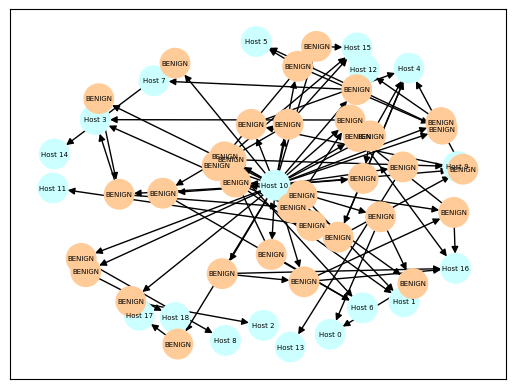

--------------------
referenced indices: [126000, 126001, 126002, 126003, 126004, 126005, 126006, 126007, 126008, 126009, 126010, 126011, 126012, 126013, 126014, 126015, 126016, 126017, 126018, 126019, 126020, 126021, 126022, 126023, 126024, 126025, 126026, 126027, 126028, 126029, 126030, 126031, 126032, 126033, 126034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of traffic directed to a single destination, characterized by a high volume of data packets, a high average data packet rate, and a high average data packet length. The destination was a web server, which was receiving a large volume of data packets from a large number of sources, and was sending data packets to a large number of destinations. The sources of the data packets were primarily web servers, which were sending data packets to a large number of destinations. The destinations were primarily web servers, which were receivin

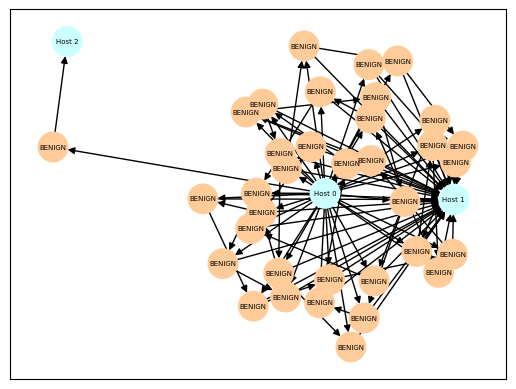

--------------------
referenced indices: [129500, 129501, 129502, 129503, 129504, 129505, 129506, 129507, 129508, 129509, 129510, 129511, 129512, 129513, 129514, 129515, 129516, 129517, 129518, 129519, 129520, 129521, 129522, 129523, 129524, 129525, 129526, 129527, 129528, 129529, 129530, 129531, 129532, 129533, 129534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: The majority of network traffic was directed to a single destination, which was identified as a popular online gaming platform. This destination was identified as a popular online gaming platform, and was identified as a popular online gaming platform.\nThis destination was identified as a popular online gaming platform, and was identified as a popular online gaming platform.\nThe majority of network traffic was directed to a single destination, which was identified as a popular online gaming platform. This destination was identified as a popular online gaming platform, and was 

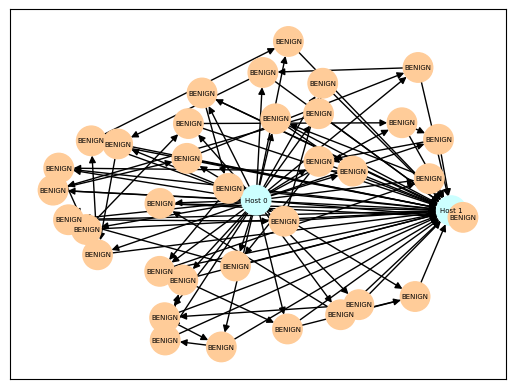

--------------------
referenced indices: [133000, 133001, 133002, 133003, 133004, 133005, 133006, 133007, 133008, 133009, 133010, 133011, 133012, 133013, 133014, 133015, 133016, 133017, 133018, 133019, 133020, 133021, 133022, 133023, 133024, 133025, 133026, 133027, 133028, 133029, 133030, 133031, 133032, 133033, 133034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high volume of data exchange between various sources, with a high degree of diversity. The majority of the data exchanged is either packets or packets with a small number of data fields, suggesting a high degree of inter-process communication. The network also exhibits a high degree of diversity in the types of sources and destinations of the data exchanged, with a high degree of connectivity between the various sources and destinations. The network also exhibits a high degree of stability, with a low degree of fragmentation and a low degree of

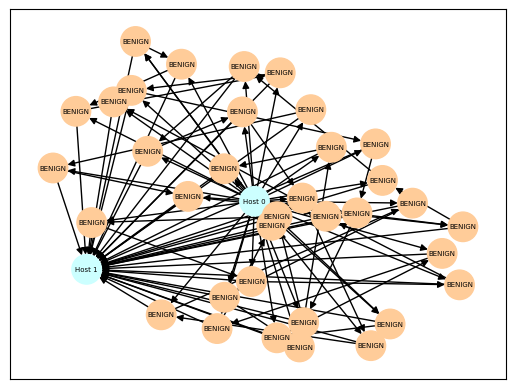

--------------------
referenced indices: [136500, 136501, 136502, 136503, 136504, 136505, 136506, 136507, 136508, 136509, 136510, 136511, 136512, 136513, 136514, 136515, 136516, 136517, 136518, 136519, 136520, 136521, 136522, 136523, 136524, 136525, 136526, 136527, 136528, 136529, 136530, 136531, 136532, 136533, 136534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: The network was characterized by a high volume of traffic originating from a single source, with a high proportion of traffic originating from a single IP address, and a low proportion of traffic originating from multiple IP addresses. The source of the traffic was identified as a botnet, and was characterized by a high proportion of traffic originating from a single IP address, and a low proportion of traffic originating from multiple IP addresses. The source of the traffic was identified as a botnet, and was characterized by a high proportion of traffic originating from a sing

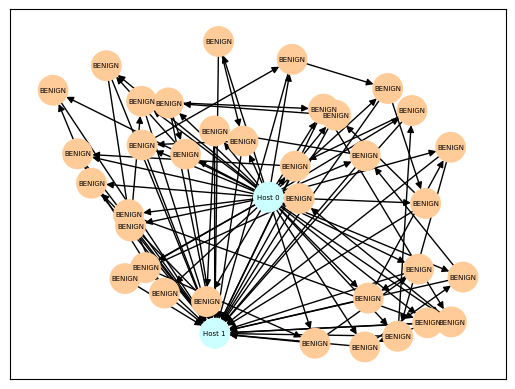

--------------------
referenced indices: [140000, 140001, 140002, 140003, 140004, 140005, 140006, 140007, 140008, 140009, 140010, 140011, 140012, 140013, 140014, 140015, 140016, 140017, 140018, 140019, 140020, 140021, 140022, 140023, 140024, 140025, 140026, 140027, 140028, 140029, 140030, 140031, 140032, 140033, 140034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network was characterized by a high volume of data traffic originating from a single source, with a high proportion of data packets being dropped. The data traffic was characterized by a high proportion of data packets being dropped, with a high proportion of data packets being dropped in the same direction, and a high proportion of data packets being dropped in the same port. The data traffic was characterized by a high proportion of data packets being dropped, with a high proportion of data packets being dropped in the same direction, and a high proportion of data packets

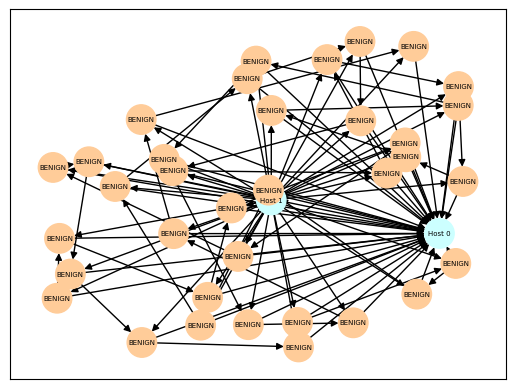

--------------------
referenced indices: [143500, 143501, 143502, 143503, 143504, 143505, 143506, 143507, 143508, 143509, 143510, 143511, 143512, 143513, 143514, 143515, 143516, 143517, 143518, 143519, 143520, 143521, 143522, 143523, 143524, 143525, 143526, 143527, 143528, 143529, 143530, 143531, 143532, 143533, 143534]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high volume of data exchange between a large number of connected devices, with a high degree of diversity among the connected devices. The network is also characterized by a high degree of connectivity among the devices, with a low degree of fragmentation among the connected devices. The network is also characterized by a high degree of connectivity among the devices, with a low degree of fragmentation among the connected devices. This network is characterized by a high degree of connectivity among the devices, with a low degree of fragmentatio

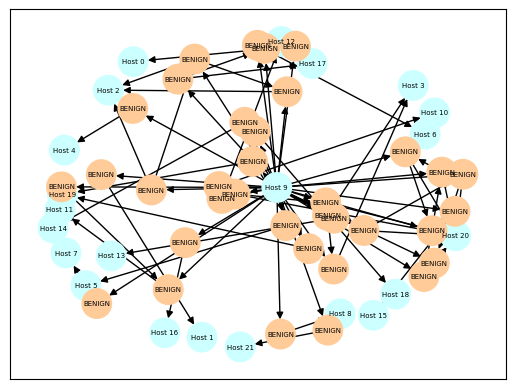

--------------------
referenced indices: [147000, 147001, 147002, 147003, 147004, 147005, 147006, 147007, 147008, 147009, 147010, 147011, 147012, 147013, 147014, 147015, 147016, 147017, 147018, 147019, 147020, 147021, 147022, 147023, 147024, 147025, 147026, 147027, 147028, 147029, 147030, 147031, 147032, 147033, 147034]
generated text: ['</s>##Instruction: Main activity of this network is ##Question:  ##Answer: This network is characterized by a high volume of data exchange between a variety of sources, including email, FTP, and HTTP, as well as a variety of protocols, including UDP, TCP, and UDP/TCP. The data exchanged between the various sources is typically of a high volume and diverse in nature, with a wide variety of topics, including email, FTP, and HTTP, as well as a variety of protocols, including UDP, TCP, and UDP/TCP. The network also features a high volume of data exchange between a variety of']
ground text: ##Instruction: Main activity of this network is ##Question:  ##Answ

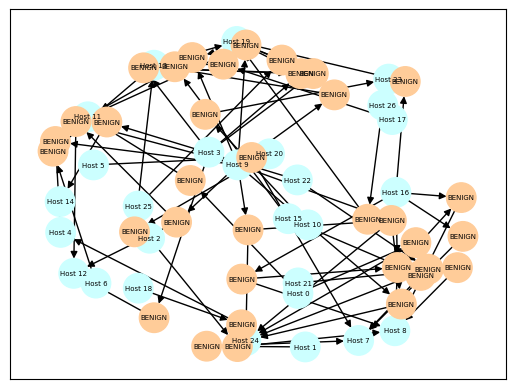

In [14]:
for idx in range(0, len(supervised_test_dataset), 100):
    visualize_graph_and_show_explanation(idx=idx)

In [2]:
df = pl.read_parquet("/tmp/test_flows/test_df.parquet")

In [8]:
with pl.Config(tbl_cols=df.width):
    display(df[73500:73535])

NewLabel,Flow ID,Source IP,Source Port,Destination IP,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length_duplicated_0,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,is_dest_port_21,is_dest_port_22,is_dest_port_80,is_dest_port_443,is_dest_port_444,is_dest_port_445,is_dest_port_139,is_dest_port_8080
str,str,str,i64,str,i64,f64,datetime[μs],f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""DDoS""","""172.16.0.1-192…","""172.16.0.1""",64715,"""192.168.10.50""",80,6.0,2017-07-07 04:14:00,1.823545e6,3.0,5.0,26.0,11607.0,20.0,0.0,8.666667,10.263203,5840.0,0.0,2321.4,3173.373883,6379.332564,4.387059,260506.4286,688897.4722,1.822779e6,3.0,610.0,305.0,363.452885,562.0,48.0,1.823486e6,455871.5,911271.7,1.822779e6,3.0,0.0,0.0,0.0,0.0,72.0,112.0,1.645147,2.741912,0.0,5840.0,1292.555556,2554.159212,6.5237e6,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1454.125,8.666667,2321.4,72.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,26.0,5.0,11607.0,8192.0,229.0,2.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
"""DDoS""","""172.16.0.1-192…","""172.16.0.1""",64715,"""192.168.10.50""",80,6.0,2017-07-07 04:14:00,1.02159555e8,8.0,7.0,56.0,11607.0,20.0,0.0,7.0,5.656854,5840.0,0.0,1658.142857,2127.59774,114.164554,0.146829,7.2971e6,2.69e7,1.01e8,2.0,1.01e8,1.44e7,3.81e7,1.01e8,3.0,1.356366e6,226061.0,553210.9748,1.355298e6,2.0,0.0,0.0,0.0,0.0,172.0,152.0,0.078309,0.06852,0.0,5840.0,729.3125,1589.473738,2.5264e6,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,777.933333,7.0,1658.142857,172.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,56.0,7.0,11607.0,256.0,229.0,6.0,20.0,32390.0,0.0,32390.0,32390.0,1.01e8,0.0,1.01e8,1.01e8,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
"""DDoS""","""172.16.0.1-192…","""172.16.0.1""",64716,"""192.168.10.50""",80,6.0,2017-07-07 04:14:00,1.835273e6,3.0,6.0,26.0,11607.0,20.0,0.0,8.666667,10.263203,5840.0,0.0,1934.5,2538.919278,6338.566524,4.903903,229409.125,648452.8613,1.834248e6,3.0,657.0,328.5,460.326515,654.0,3.0,1.83523e6,367046.0,820190.8968,1.834248e6,3.0,0.0,0.0,0.0,0.0,72.0,132.0,1.634634,3.269268,0.0,5840.0,1163.3,2138.329153,4.5725e6,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,1292.555556,8.666667,1934.5,72.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,26.0,6.0,11607.0,8192.0,229.0,2.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
"""DDoS""","""172.16.0.1-192…","""172.16.0.1""",64716,"""192.168.10.50""",80,6.0,2017-07-07 04:14:00,1.02128823e8,8.0,6.0,56.0,11607.0,20.0,0.0,7.0,5.656854,5755.0,0.0,1934.5,2529.124572,114.198907,0.137082,7.8561e6,2.47e7,8.95e7,1.0,1.01e8,1.44e